In [94]:
import copy
import socket
import os
import pickle 
# import ssm #need to/ keep 
import sys
import glob
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap


sys.path.append("/Users/friederikebuck/Desktop/MBL/project/WholeBrainImagingAnalysis/collab/")
sys.path.append('/Users/bennetsakelaris/Documents/Obsidian Vault/Worms/wormcode/Code+Notes 09-24-24/collab/')

from scipy.ndimage import gaussian_filter1d
from get_data.read_neuro_beh_data import get_exp_features, load_json
from get_data.process_neural_data import get_derivative_of_neural_activity, get_neural_activity_from_labels, get_neural_activity_and_labels
from beh_classification.behavior_features import get_behavior_features
from beh_classification.get_behavior_classifications import get_behavior_classification
# from beh_classification.beh_classification_utils import get_start_end_is_of_ones_in_binary_array
from sklearn.decomposition import PCA

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import balanced_accuracy_score

from sklearn import svm
from sklearn.svm import LinearSVC
from sklearn.neighbors import NearestNeighbors

from load_data_fncs import load_all_data, get_exp_dates
from analyse_rslds_utils import make_behavior_decoder, input_slds
from sklearn.exceptions import ConvergenceWarning


In [95]:

from matplotlib.colors import LinearSegmentedColormap

#color palette for plotting, colors as in make_behavior_ethogram
palette = ["coral",     # forward
           "lightblue", # reverse
           "darkgreen", # turn
           "purple","red", "yellow", "black", "pink"]    # pause
cmap = LinearSegmentedColormap.from_list("behavior", palette, N=len(palette))


# Load data, model, behavior decoder

In [96]:


T = 1599
full_traces, full_neural_labels, full_beh_classification, full_beh_data = load_all_data()

velocity_og = np.array([full_beh_data[i]["velocity"][0:1599] for i in range(len(full_beh_data))])
acceleration_og = np.array([full_beh_data[i]["acceleration"][1:1600] for i in range(len(full_beh_data))])
head_curvature_og = np.array([full_beh_data[i]["head_angle"][0:1599] for i in range(len(full_beh_data))])
worm_curvature_og = np.array([full_beh_data[i]["worm_curvature"][0:1599] for i in range(len(full_beh_data))])
pumping_og = np.array([full_beh_data[i]["pumping"][0:1599] for i in range(len(full_beh_data))])
body_angle_mag_og = np.array([full_beh_data[i]["body_angle_mag"][0:1599] for i in range(len(full_beh_data))])
midlines_og =  np.array([full_beh_data[i]["midlines"][0:1599] for i in range(len(full_beh_data))])
body_angles_og =  np.array([full_beh_data[i]["body_angles"][0:1599] for i in range(len(full_beh_data))])

velocity = copy.deepcopy(velocity_og)
acceleration = copy.deepcopy(acceleration_og)
head_curvature = copy.deepcopy(head_curvature_og)
worm_curvature = copy.deepcopy(worm_curvature_og)
pumping = copy.deepcopy(pumping_og)
body_angle_mag =copy.deepcopy(body_angle_mag_og)
midlines =copy.deepcopy( midlines_og)
body_angles = copy.deepcopy(body_angles_og)


np.random.seed(0)

foldername = "/Users/friederikebuck/Downloads/worm notes/processed_checkpts/test_rslds_QM_run_061325/model_selection/top_2_combined/"
items = np.array(os.listdir(foldername))
folders = np.array(["." not in directory for directory in items], dtype=bool)
folders = items[folders]

folder = folders[0]

with open(foldername+"/Y.npy", 'rb') as handle:  
    Y = pickle.load(handle)


with open(foldername+folder+"/saved_data/prior.npy", 'rb') as handle:
    global_worm = pickle.load(handle)
    global_worm.D = int(global_worm.D)

with open(foldername+folder+"/saved_data/prior_q.npy", 'rb') as handle:
    q = pickle.load(handle)
    

slds = global_worm

neural_labels = np.load(foldername+"/neurons.npy", allow_pickle=True)

# set up a single behavioral state array ("z" in the language of scott): 
z = [beh_classification["is_fwd"][0:1599]+ 2*beh_classification["is_rev"][0:1599]+ 4*beh_classification["is_pause"][0:1599]+3*beh_classification["is_turn"][0:1599]-1 for beh_classification in full_beh_classification]

# get estimated latents, states
q_x = q.mean_continuous_states
q_z = [slds.most_likely_states(q_x[w], Y[w]) for w in range(len(q_x))]

# traces, neural_labels, behavior_classification, mask = load_all_data_but_pretend_its_all_one_worm()

# velocity = np.array([full_beh_data[i]["velocity"][0:1599] for i in range(len(full_beh_data))])
# # velocity_all = 
# acceleration = np.array([full_beh_data[i]["acceleration"][1:1600] for i in range(len(full_beh_data))])
# head_curvature = np.array([full_beh_data[i]["head_angle"][0:1599] for i in range(len(full_beh_data))])
# worm_curvature = np.array([full_beh_data[i]["worm_curvature"][0:1599] for i in range(len(full_beh_data))])
# pumping = np.array([full_beh_data[i]["pumping"][0:1599] for i in range(len(full_beh_data))])

q_z_all = np.concatenate(q_z)
z_all = np.concatenate(z)

# Input rSLDS
input_list = ["AVA", "RIB", "RIM", "AIB"]
new_slds, input_dict = input_slds(slds,neural_labels, input_list, input_list)
new_slds.D = int(new_slds.D)
input_dict

beh_decoder = make_behavior_decoder(q_x, z)

###############
###############
###############
###############
##############


from rslds_visualization_utils import plot_states_and_neurons
from matplotlib.backends.backend_pdf import PdfPages
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from compute_donut_utils import fix_signs, compute_phase,compute_radius, extract_rotation_angle, set_seed

import sys 

sys.path.append("/Users/friederikebuck/")
sys.path.append("/Users/friederikebuck/Desktop/MBL/project/WholeBrainImagingAnalysis/collab/")
sys.path.append('/Users/bennetsakelaris/Documents/Obsidian Vault/Worms/wormcode/Code+Notes 09-24-24/collab/')
sys.path.append("/Users/friederikebuck/Downloads/worm notes/worm_code/fit_hierarchical/")

emissions_dim = max(traces.shape[1] for traces in full_traces)
model = slds

exp_dates = get_exp_dates() 




y = np.array(q_x)
pca = PCA(n_components=9, svd_solver="full")
pca.fit(np.concatenate(q_x[:-2])) #leave out two worms to test generalization
pca.components_ = fix_signs(pca.components_)
pca_x = pca.transform(np.concatenate(q_x))

#instead of training on phase, we'll train on sin and cosine to avoid the jumping between 2pi and 0
thetas = np.array([compute_phase(q_x[i], pca) for i in range(21)])
y_sin = [np.sin(y_i) for y_i in thetas]
y_cos = [np.cos(y_i) for y_i in thetas]

y = np.zeros((21, 1599, 3))
y[:,:,0] = y_sin
y[:,:,1] = y_cos
y[:,:,2] = [compute_radius(q_x[i], pca) for i in range(21)]

rotated_data = extract_rotation_angle(pca_x, n_neighbors=5)

rotated_data2d = rotated_data[:, 1:3]  # Project onto the principal plane
angles = np.arctan2(rotated_data2d[:, 1], rotated_data2d[:, 0])  

n_worms, timepoints = [21, 1599]
# angles = np.radians((270-np.degrees(angles+ np.pi))%360-180)

angles = angles.reshape(n_worms, timepoints)
rotated_data2d = rotated_data2d.reshape(n_worms, timepoints, 2)

y_sin = np.sin(angles)
y_cos = np.cos(angles)
radii = np.sqrt(rotated_data2d[..., 0]**2 + rotated_data2d[..., 1]**2)

y = np.stack([y_sin, y_cos, radii], axis=-1)
y.shape
z_norm = np.array(z, np.float64)

#####################
#####################
#####################
#####################

velocity -= velocity.mean()
velocity /= velocity.std()
acceleration -= acceleration.mean()
acceleration /= acceleration.std()
worm_curvature -= worm_curvature.mean()
worm_curvature /= worm_curvature.std()
z_norm -= z_norm.mean()
z_norm /= z_norm.std()
z_flat = np.array(z).flatten()
from angle.preprocess import prepare_data, split_and_normalize
from angle.train import train_model
from angle.plot_funcs_1 import plot_prediction, plot_held_out_worm

set_seed(42)
normalize=False
T = 5
X_all, y_all = prepare_data([velocity, acceleration, worm_curvature, z_norm], y, T=T, holdout_idxs=[20])
X_train, X_test, y_train, y_test, input_stats = split_and_normalize(X_all, y_all, normalize=normalize) # test here is held-out timepoints of held-in worms

input_dim = X_train.shape[2]
output_dim = y_train.shape[1]



#####################
#####################
#####################
#####################

from spont_rev_prediction_fncs import prep_data_spont_rev_prob, predict_spont_revs_from_features, predict_spont_revs_from_features_single_feature
from predict_latency_prob_from_features_donut import prep_FB_inputs_select_features_only_no_onset, fit_eval_linearSVC, visualize_model_classification
from predict_latency_prob_from_features_donut import fit_eval_lasso, visualize_model_regression
from spont_rev_prediction_fncs import predict_spont_revs_from_features, predict_spont_revs_from_features_single_feature, prep_data_spont_rev_latency

feature_list = [velocity, acceleration, worm_curvature]
feature_labels = ["flav_vel", "flav_accel", "flav_curv"]
rev_bin = np.array([z_w ==1 for z_w in z])





feature_list = [velocity, acceleration, worm_curvature]
feature_labels = ["flav_vel", "flav_accel", "flav_curv"]
rev_bin = np.array([z_w ==1 for z_w in z])


beh_map = [z_norm.min(), z_norm.min()/2 + z_norm.max()/2, z_norm.max()]




Worm 0, date: 2022-06-14-01
Worm 1, date: 2023-01-23-08
Worm 2, date: 2022-06-28-07
Worm 3, date: 2022-07-15-12
Worm 4, date: 2023-01-19-01
Worm 5, date: 2022-08-02-01
Worm 6, date: 2022-06-14-07
Worm 7, date: 2022-06-28-01
Worm 8, date: 2023-01-23-15
Worm 9, date: 2022-07-26-01
Worm 10, date: 2023-01-19-15
Worm 11, date: 2023-03-07-01
Worm 12, date: 2022-06-14-13
Worm 13, date: 2023-01-23-21
Worm 14, date: 2023-01-19-22
Worm 15, date: 2023-01-23-01
Worm 16, date: 2023-01-17-01
Worm 17, date: 2022-07-20-01
Worm 18, date: 2023-01-09-28
Worm 19, date: 2023-01-19-08
Worm 20, date: 2022-07-15-06


/Users/friederikebuck/Desktop/MBL/project/WholeBrainImagingAnalysis/collab/beh_classification/behavior_features.py:11: RuntimeWarning: Mean of empty slice
  body_angles = body_angles-np.nanmean(body_angles, axis = 1)[:, None]
/Users/friederikebuck/Desktop/MBL/project/WholeBrainImagingAnalysis/collab/beh_classification/behavior_features.py:15: RuntimeWarning: Mean of empty slice
  centroids = np.nanmean(midlines, axis = 1)


KeyboardInterrupt: 

in load data
[]
NOT using body angle mag for curvature
in replace_outliers_exp
in plot data
in reformar data
flavell_velocity.shahpe (21, 1599)
plotted
exp_acc1 (624600,)
resamplsep_pos_neg_resampleing
exp_acc1.shape) (166560,)

resampled_pause (166560,)
resampling
matching cdfs
in plot data
bins [-3.14159265 -2.51327412 -1.88495559 -1.25663706 -0.62831853  0.
  0.62831853  1.25663706  1.88495559  2.51327412  3.14159265]


/Users/friederikebuck/Downloads/worm notes/worm_code/visualize_donut_time_series_and_states.py:125: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  ax1.scatter(
/Users/friederikebuck/Downloads/worm notes/worm_code/visualize_donut_time_series_and_states.py:125: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  ax1.scatter(
/Users/friederikebuck/Downloads/worm notes/worm_code/visualize_donut_time_series_and_states.py:125: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  ax1.scatter(
/Users/friederikebuck/Downloads/worm notes/worm_code/visualize_donut_time_series_and_states.py:125: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  ax1.scatter(
/Users/friederikebuck/Downloads/worm notes/worm_code/visualize_donut_time_series_and_states.py:125: UserWarning: *c* argument looks like a single nu

Number of bins: 10
Number of bins: 10
Number of bins: 10
Number of bins: 10
Number of bins: 10
[<Figure size 400x200 with 2 Axes>, <Figure size 1400x400 with 12 Axes>, <Figure size 1800x300 with 18 Axes>, <Figure size 1200x300 with 12 Axes>, <Figure size 1900x700 with 24 Axes>, <Figure size 1600x700 with 24 Axes>]


[<Figure size 400x200 with 2 Axes>,
 <Figure size 1400x400 with 12 Axes>,
 <Figure size 1800x300 with 18 Axes>,
 <Figure size 1200x300 with 12 Axes>,
 <Figure size 1900x700 with 24 Axes>,
 <Figure size 1600x700 with 24 Axes>]

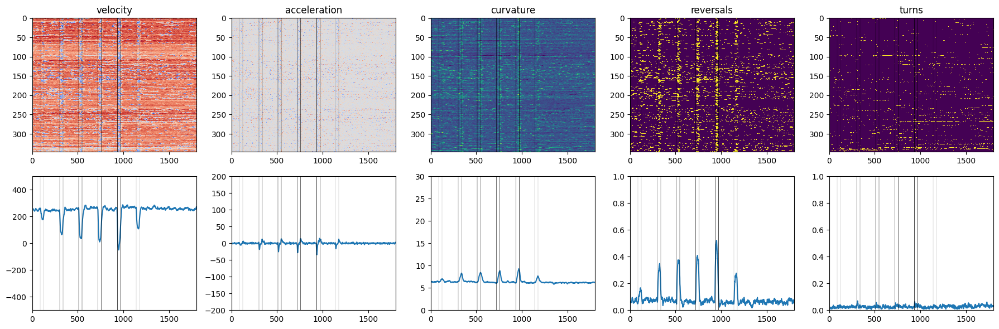

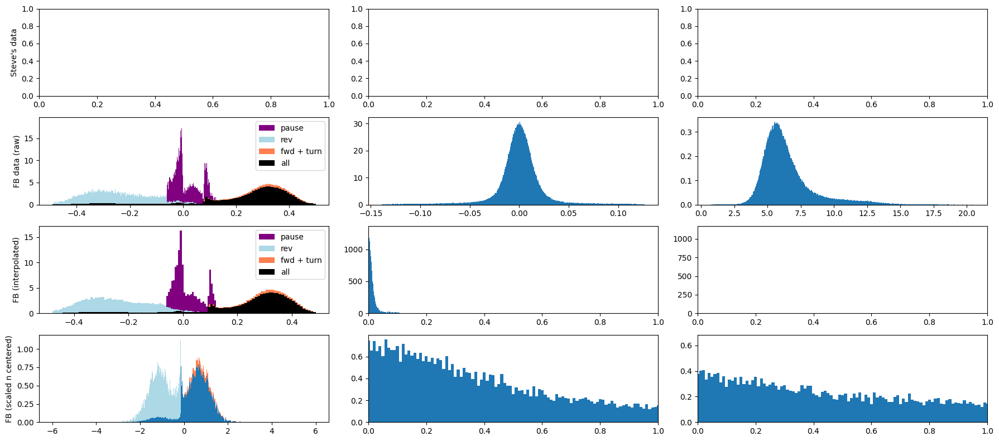

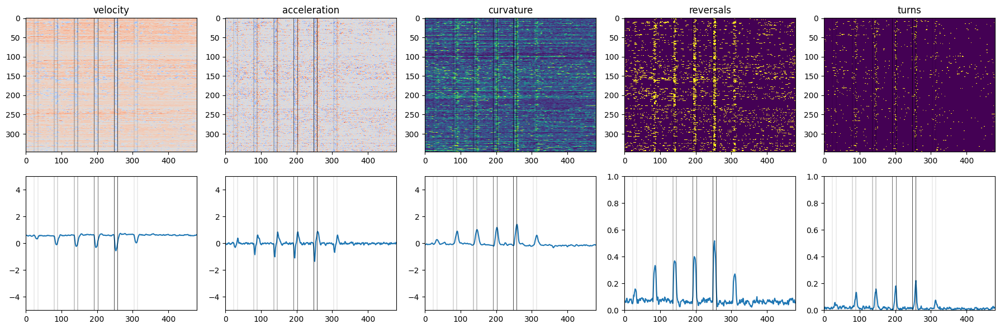

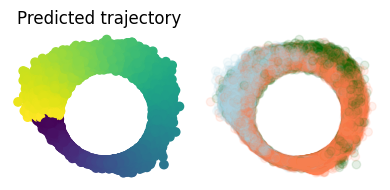

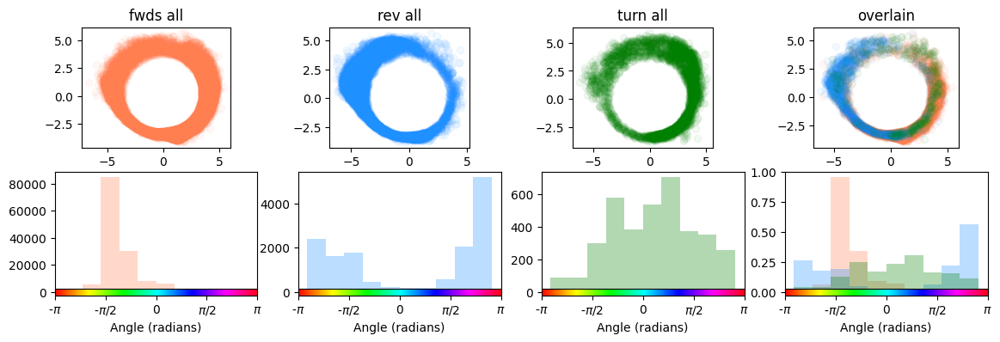

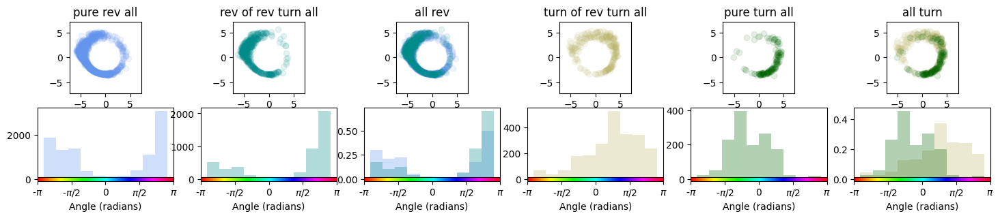

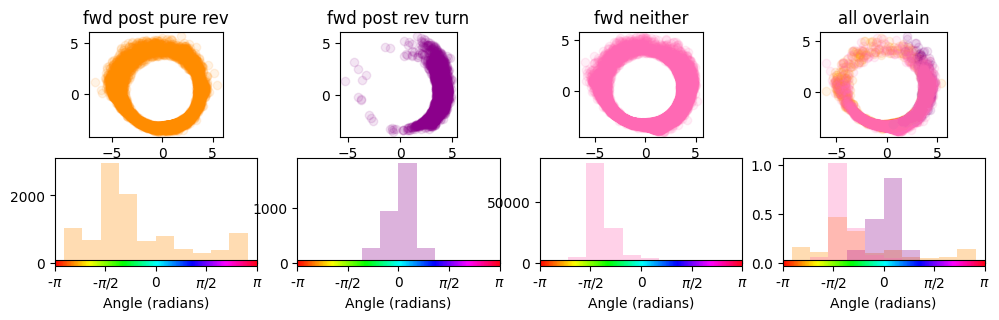

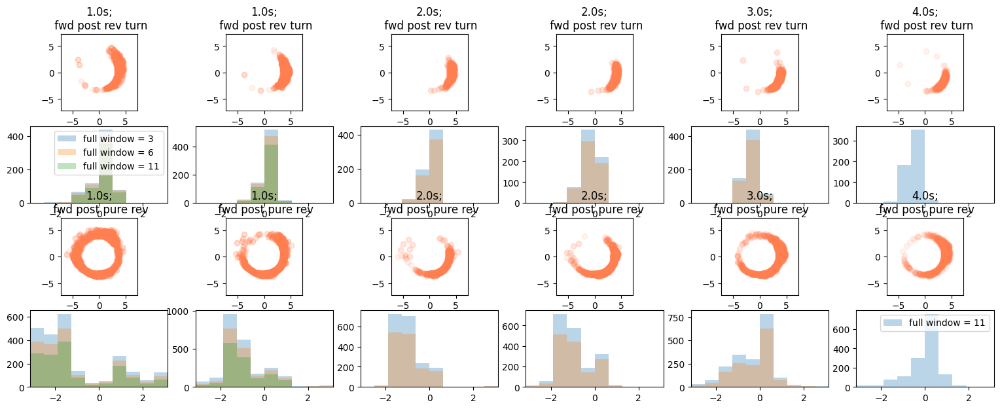

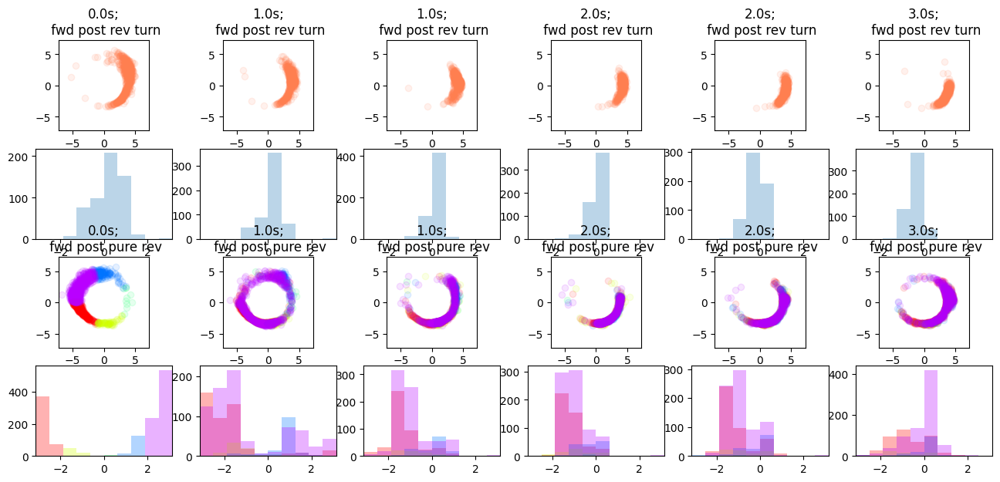

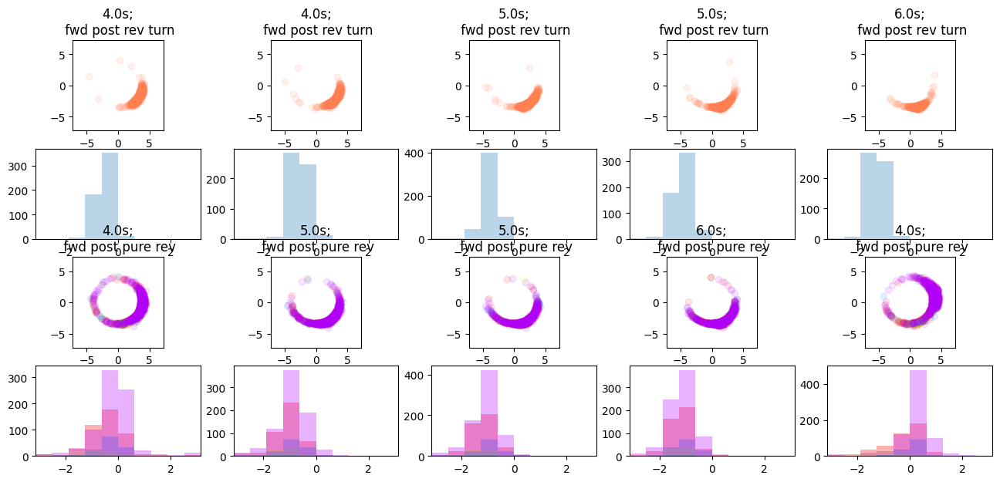

In [135]:
from visualize_donut_time_series_and_states import plot_donut_beh_figs_1
import pickle 
pickle_fname = "/Users/friederikebuck/Downloads/worm notes/processed_checkpts/worm_angles_concat_neural.pickle"
with open(pickle_fname, "rb") as handle:
    worm_angles_concat_neural, worm_radii_concat_neural, model_neural_directed = pickle.load(handle) 
    



pickle_fname = "/Users/friederikebuck/Downloads/worm notes/processed_checkpts/worm_angles_concat_beh.pickle"
with open(pickle_fname, "rb") as handle:
   worm_angles, worm_radii, model_beh_directed =  pickle.load( handle) 
    
    
from load_and_process_FB_data_fncs_8 import load_data, reformat_data,plot_data,  analyze_data, replace_outliers_exp, reformat_data_1
# experiment = "duty_cycle"
# condition = "exp"
# neuron = "AVA"
# path = "/Users/friederikebuck/beh_analysis_results/csv/_Aim1_AVA_duty_cycle/"


experiment = "duty_cycle"
condition = "exp"
neuron = "AIB"
path = "/Users/friederikebuck/beh_analysis_results/csv/_AIBC-3_Aim1_AIB_duty_cycle/"


# experiment = "duty_cycle"
# condition = "exp"
# neuron = "RIM"
# path = "/Users/friederikebuck/beh_analysis_results/csv/_Aim1_RIM_duty_cycle/"

from load_and_process_FB_data_fncs_8 import  causal_moving_average,plot_data,   reformat_data_1, replace_outliers_exp, replace_outliers_neg_post_seperate_and_resample, smooth_trace,replace_outliers_and_resample,resample_binary,   match_cdf 


exp_data = load_data(experiment, condition, neuron, path = path)


stim_exp_vel, stim_exp_acc, stim_exp_curve, stim_exp_rev, stim_exp_pause, stim_exp_turn, stim_exp_body_angle_mag  = replace_outliers_exp(exp_data, exp_data[0].shape)

exp_onsets = plot_data(stim_exp_vel, stim_exp_acc, stim_exp_curve, stim_exp_rev, stim_exp_pause, experiment, fps=6)

stim_resampled_rev, stim_resampled_turn,stim_resampled_features,  stim_smooth_features, stim_matched_features = reformat_data_1(stim_exp_vel, 
                                                                                             stim_exp_acc,
                                                                                             stim_exp_curve,
                                                                                             stim_exp_rev,
                                                                                             stim_exp_turn, 
                                                                                             stim_exp_pause,
                                                                                             z_flat,
                                                                                             velocity, 
                                                                                             acceleration, 
                                                                                             worm_curvature,
                                                                                             plot=True, 
                                                                                             replace_outliers = True, 
                                                                                             sep_pos_neg_resample = True, match_vel_only = True
                                                                                             )

stim_resampled_vel, stim_resampled_acc, stim_resampled_curve = stim_resampled_features
stim_smooth_vel, stim_smooth_acc, stim_smooth_curve = stim_smooth_features
stim_matched_vel, stim_matched_acc, stim_matched_curve = stim_matched_features


onsets = plot_data(stim_matched_vel, stim_matched_acc, stim_matched_curve, stim_resampled_rev, stim_resampled_turn, experiment, fps=1.6, orig = False)
resampled_onsets = onsets

inferred_phases, final_behaviors, final_behaviors_all, inferred_phases_all, inferred_rad_all, behaviors_all, inferred_rad, initial_behaviors, initial_cts_beh, X_all_LSTM = analyze_data(stim_matched_vel,
                                                                                                                                                                                         stim_matched_acc, 
                                                                                                                                                                                         stim_matched_curve, 
                                                                                                                                                                                         stim_resampled_rev, 
                                                                                                                                                                                         stim_resampled_turn, 
                                                                                                                                                                                         onsets, 
                                                                                                                                                                                         model_beh_directed,  
                                                                                                                                                                                         z_norm,input_stats,  
                                                                                                                                                                                         z,   
                                                                                                                                                                                         lag=16, 
                                                                                                                                                                                         inclusion_thresh = 2, 
                                                                                                                                                                                         model_type="ff", 
                                                                                                                                                                                         remove_revs=False
                                                                                                                                                                                         
                                                                                                                                                                                         )
beh_all_org = (behaviors_all*  np.array(z).std())+ np.array(z).mean()

plot_donut_beh_figs_1(inferred_phases_all,inferred_rad_all,  beh_all_org,

                         cmap,
                            n_bins = 10, 
                         window = 5)



    

# Plot all worms -- LSTM

In [ ]:
# from predict_latency_prob_from_features_donut import fit_eval_linearSVC, plot_coeffs, prep_FB_inputs_select_features_only_no_onset, visualize_model_classification ##Real ** 
# from predict_latency_prob_from_features_donut import fit_eval_lasso

In [ ]:


from sklearn.metrics import ConfusionMatrixDisplay
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LinearRegression, Lasso, TweedieRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn import tree
import warnings
from predict_latency_prob_from_features_donut import prep_FB_inputs, fit_visualize_model_classifiction, prep_FB_inputs_features_only, latency_to_reversal
from predict_latency_prob_from_features_donut import prep_FB_inputs_select_features_only, prep_FB_inputs_features_only, feature_all_to_resampled, resample_2d
# # from predict_latency_prob_from_features_donut_6 import visualize_model_classification, combine_FB_features_across_stim, prep_FB_inputs_select_features_only, latency_to_reversal, fit_visualize_model_regression
from predict_latency_prob_from_features_donut import prep_FB_inputs_select_features_only, prep_FB_inputs_features_only

from predict_latency_prob_from_features_donut import prep_FB_inputs_select_features_only, prep_FB_inputs_features_only
from predict_latency_prob_from_features_donut import prep_FB_inputs_select_features_only, prep_FB_inputs_features_only
from predict_latency_prob_from_features_donut import visualize_model_classification, combine_FB_features_across_stim
from predict_latency_prob_from_features_donut import prep_FB_inputs_feature_and_donut, prep_FB_inputs_features_only
# from predict_latency_prob_from_features_donut import visualize_model_classification, combine_FB_features_across_stim


from predict_latency_prob_from_features_donut import prep_FB_inputs_select_features_only, prep_FB_inputs_features_only, feature_all_to_resampled





from predict_latency_prob_from_features_donut_6 import prep_data_rev_prob, visualize_model_classification#, get_plot_multi_stim_model_single_feature# get_plot_multi_stim_model, get_plot_multi_stim_model_single_feature


In [123]:
def prep_FB_inputs_select_features_only_1(
                    features_list, feature_labels, 
                     n_timesteps, onset,
                    fps = None
                   ): 
    if fps is None: 
        fps = 1

#     X_all_LSTM = []
    # for new_worm_idx in range(len(features_list[0])):
    # X_new_worm = np.stack([feature[new_worm_idx] for feature in features_list
    #                         ], axis=1)  
    feature_names = np.array([[f"{lbl}_t-{np.round((n_timesteps - t + 1)/fps, 2)}" 
                                                        for t in range(n_timesteps)  ]
                                                    for lbl in feature_labels ]).flatten()
        
    X_all  = []
    feature_names = []
    for feature_mat, lbl in zip(features_list, feature_labels):
        X_all.append(feature_mat[:, (onset-n_timesteps):onset])#ntrack, n frame
        feature_names.append([f"{lbl}_t-{np.round((n_timesteps - t + 1)/fps, 2)}" 
                                                        for t in range(n_timesteps) ])

    return np.concatenate(X_all, axis = 1) , np.concatenate(feature_names)

i, n_timesteps 0 1
i, n_timesteps 0 4
i, n_timesteps 0 7
i, n_timesteps 0 10
i, n_timesteps 0 13
i, n_timesteps 1 1
i, n_timesteps 1 4
i, n_timesteps 1 7
i, n_timesteps 1 10
i, n_timesteps 1 13
i, n_timesteps 2 1
i, n_timesteps 2 4
i, n_timesteps 2 7
i, n_timesteps 2 10
i, n_timesteps 2 13
i, n_timesteps 3 1
i, n_timesteps 3 4
i, n_timesteps 3 7
i, n_timesteps 3 10
i, n_timesteps 3 13
i, n_timesteps 4 1
i, n_timesteps 4 4
i, n_timesteps 4 7
i, n_timesteps 4 10
i, n_timesteps 4 13
i, n_timesteps 5 1
i, n_timesteps 5 4
i, n_timesteps 5 7
i, n_timesteps 5 10
i, n_timesteps 5 13
feature_names_all ['stim exp vel_t-1.5' 'stim exp accel_t-1.5' 'stim exp curv_t-1.5'
 'stim exp vel_t-1.33' 'stim exp accel_t-1.33' 'stim exp curv_t-1.33'
 'stim exp vel_t-1.17' 'stim exp accel_t-1.17' 'stim exp curv_t-1.17'
 'stim exp vel_t-1.0' 'stim exp accel_t-1.0' 'stim exp curv_t-1.0'
 'stim exp vel_t-0.83' 'stim exp accel_t-0.83' 'stim exp curv_t-0.83'
 'stim exp vel_t-0.67' 'stim exp accel_t-0.67' 'stim exp

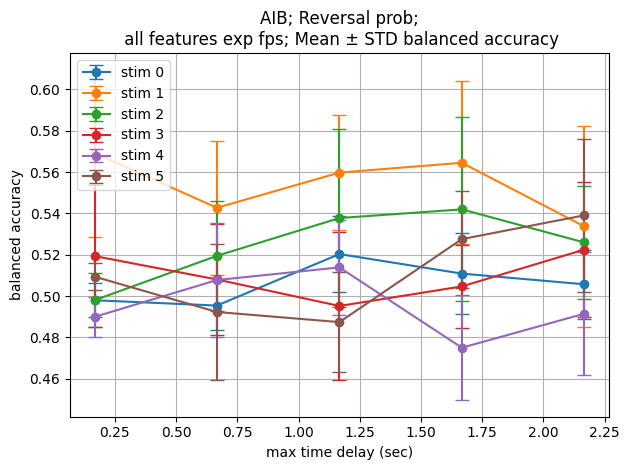

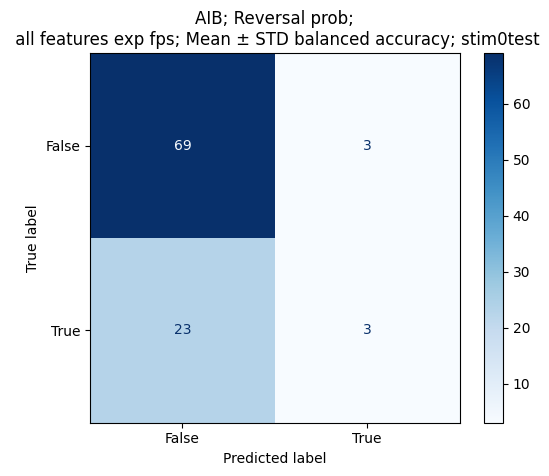

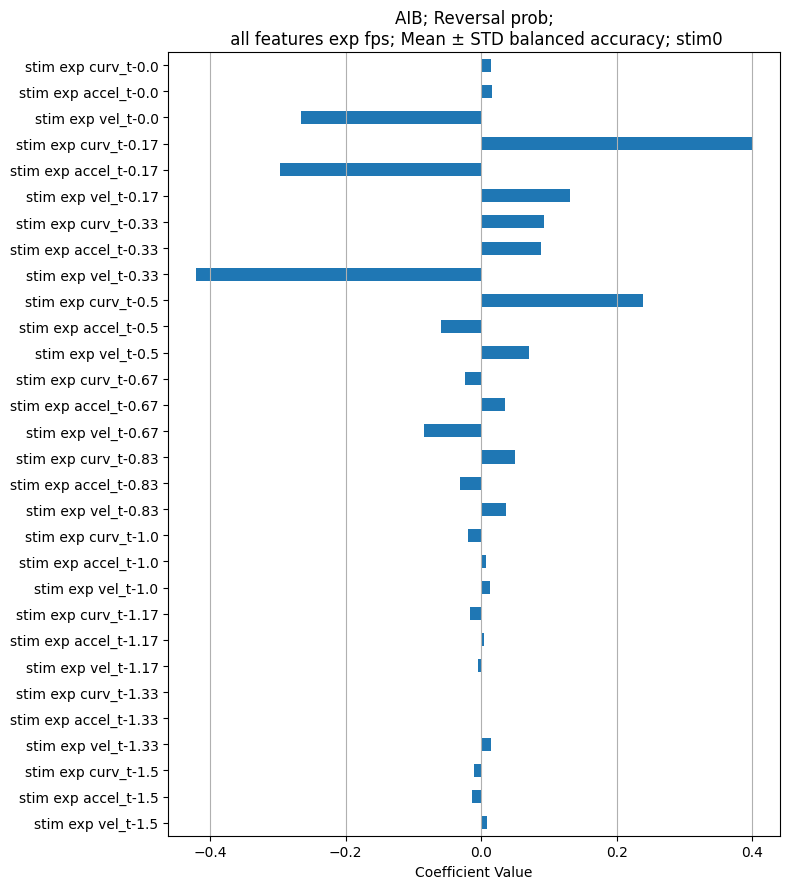

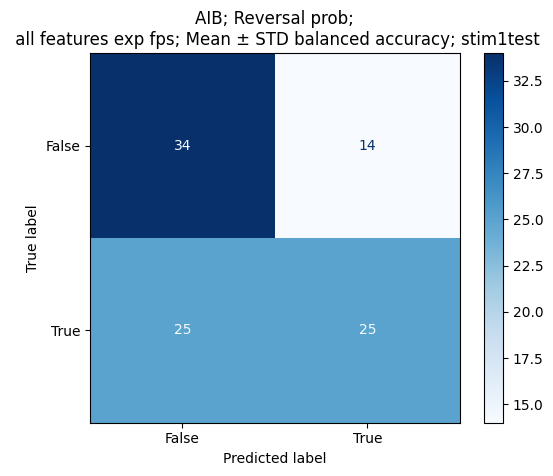

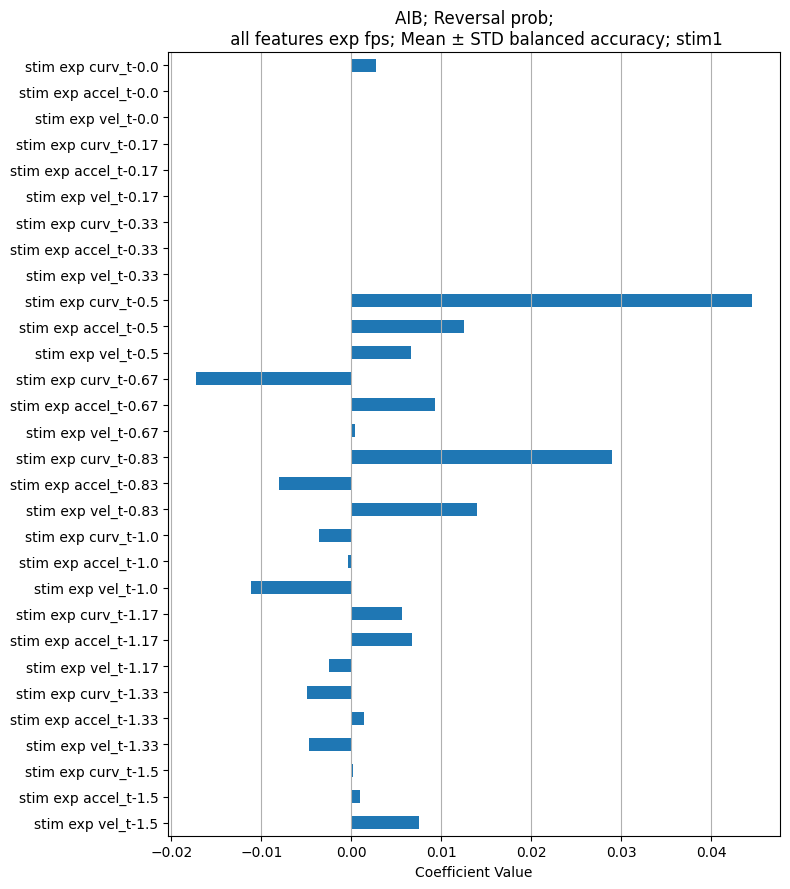

...

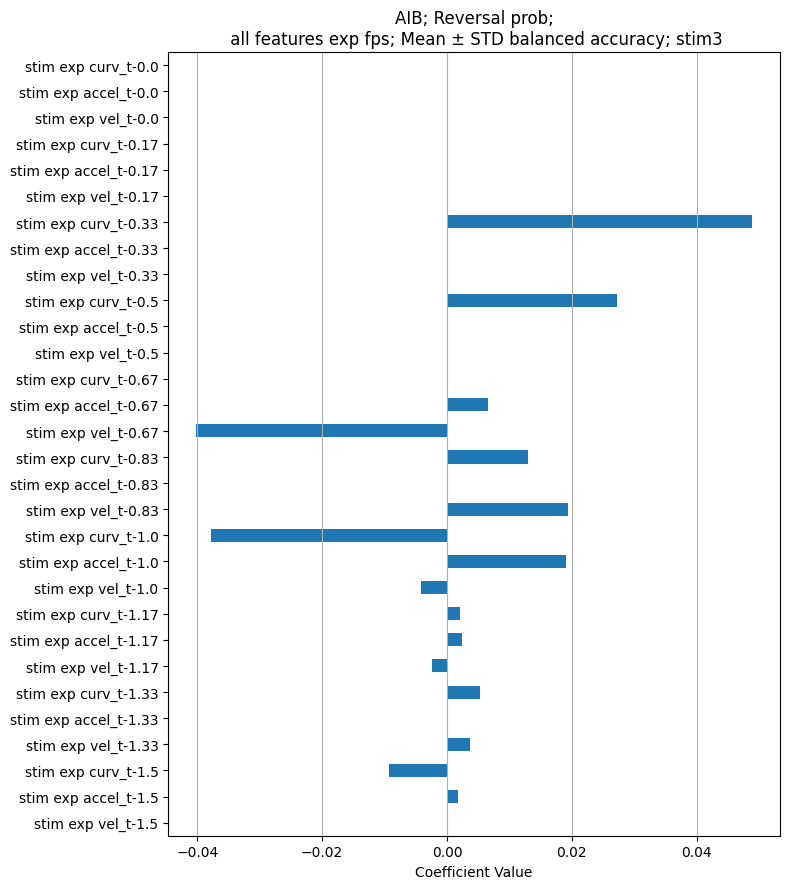

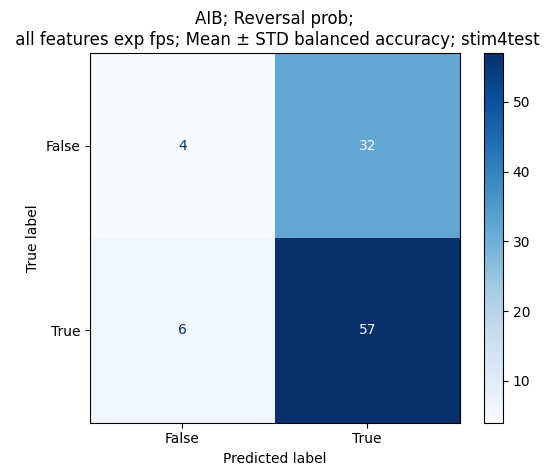

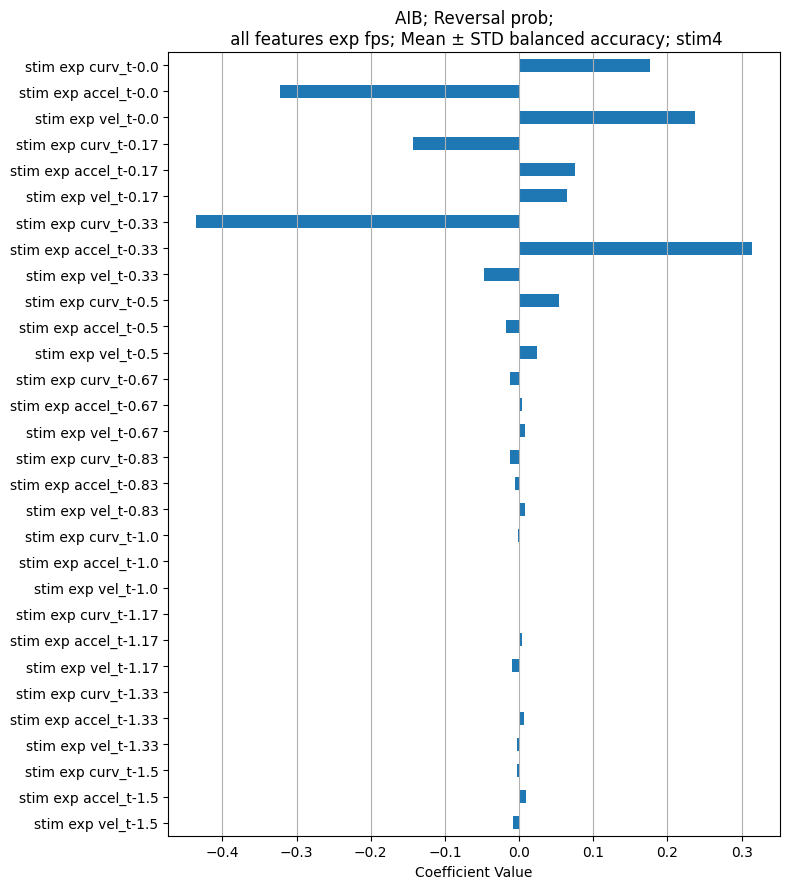

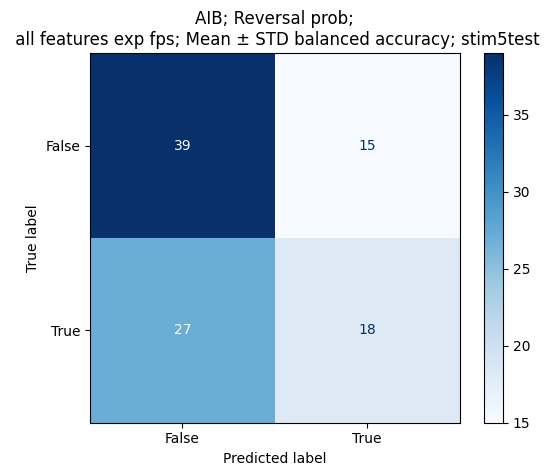

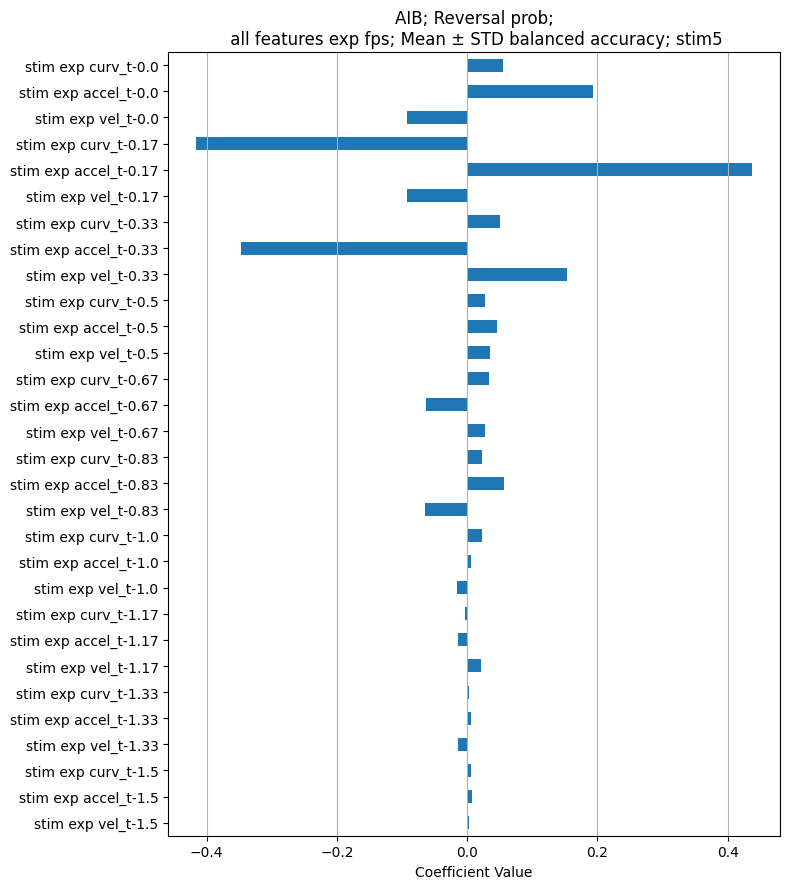

In [136]:
def train_model_feature_list(data_prep_fnc,
                               model_fit_fnc, 
                               result_visualization_fnc, 
                               feature_list, 
                               feature_labels,
                               z, 
                               data_onsets,
                               exp_onsets, 
                               exp_rev, 
                               durations,
                               fps,
                           
                               title_label,
                               test_size = 0.3, 
                               n_splits = 10, 
                               lstm_lag = 0, 
                               score_label = "",
                               single_feature = False, 
                               rev_bin = None, 
                               all_timesteps = None, 
                               check_warnings = True
                            ):
    if check_warnings:
        with warnings.catch_warnings():
            warnings.filterwarnings("ignore", category=ConvergenceWarning)
            fig, ax = plt.subplots()
            best_models = {} 
            all_scores_per_i = {}
            results_dict = {}
            for i, (data_onset, exp_onset) in enumerate(zip(data_onsets, exp_onsets)):
                
                onset = data_onset-1
                score_means = []
                score_stds = []
                n_timesteps_list = []
                Y_latency = latency_to_reversal(exp_rev, exp_onset, max_latency = 6*durations[i]+1)/6 # nan where not 
                # if rev_bin is not None: 
                #     fig3, ax3 = plt.subplots(figsize = (8,20))
                #     vline = onset - lstm_lag
                #     sort = np.argsort(Y_latency)
                #     ax3.imshow(rev_bin[sort, vline-25:vline+25])
                    
                #     ax3.set_title(f"onset: {onset}")
                #     ax3.axvline(25, color = "red")
                    
                
                if all_timesteps is None: 
                    all_timesteps = range(1, 15, 3)

                for n_timesteps in all_timesteps:
                    print("i, n_timesteps",i,  n_timesteps)
                    scores = []
                    models = []

                

                    # X_stim_all, feature_names_all = prep_FB_inputs_select_features_only(
                    #     feature_list, feature_labels, onset,  n_timesteps, z, lstm_lag = lstm_lag, fps = fps
                    #                 )
                    
                    X_stim_all, feature_names_all = prep_FB_inputs_select_features_only_1(feature_list, feature_labels, 
                                                                                                                n_timesteps, onset,
                                                                                                                fps = fps)
                    


                    
                    X,Y = data_prep_fnc(X_stim_all, Y_latency)



                    for split_idx in range(n_splits):
                        X_train, X_test, y_train, y_test = train_test_split(
                            X, Y, test_size=test_size, random_state=split_idx)
                        best_model, y_pred, score = model_fit_fnc(X_train, X_test, y_train, y_test)
                        scores.append(score)
                        models.append((best_model,X_train, X_test, y_train, y_test))

                    scores_mean = np.mean(scores)
                    scores_std = np.std(scores)
                    best_model_idx = np.argmax(scores)
                    best_model_overall = models[best_model_idx]

                    # Save results
                    n_timesteps_list.append(n_timesteps)
                    # all_r2_means.append(r2s)
                    all_scores_per_i[(i, n_timesteps)] = scores
                    score_means.append(scores_mean)
                    score_stds.append(scores_std)
                    results_dict[(i, n_timesteps)] = (scores_mean, scores_std)
                    best_models[(i, n_timesteps)] = best_model_overall
                    

                # cmap1 = cm.get_cmap('tab10', len(resampled_onsets))
                ax.errorbar(np.array(n_timesteps_list)/fps, score_means, yerr=score_stds, #color=cmap1(i),
                            fmt='-o', capsize=5, label = f"stim {i}")

                ax.set_title(title_label)
                ax.set_xlabel("max time delay (sec)")
                ax.set_ylabel(f"{score_label}")
                ax.legend()
                plt.grid(True)
                plt.tight_layout()


            n_timesteps = all_timesteps[-2]
            for i in range(len(exp_onsets)):
                model,X_train, X_test, y_train, y_test = best_models[(i, n_timesteps)] 

                model_label= f"{title_label}; stim{i}"#; lasso_a{np.round(alpha,2)}"
                if single_feature: 
                    feature_lbl = feature_labels[0]
                    feature_names = np.array([[f"{feature_lbl}_t-{np.round((n_timesteps - t - 1)/fps, 2)}"]
                                        for t in range(n_timesteps)]).flatten()
                    result_visualization_fnc(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = False, coeffs = model.coef_[0])#, xlim = [-2,1])
                    
                else: 
                    _,  feature_names_all = prep_FB_inputs_select_features_only(
                        # resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn,
                        feature_list, feature_labels, onset,  n_timesteps, z, lstm_lag = lstm_lag,  fps = fps
                                    )
                    print("feature_names_all",feature_names_all)
                    result_visualization_fnc(model, model_label, feature_names_all, X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = False)#, xlim = [-2,1])

if experiment == "time_titration":
    durations = [1,3,5,10]
else:
    durations = [5,5,5,5,5,5]
    if experiment == "hiscl":
        durations = [5,5]
resampled_timesteps = np.arange(1,20,5)# [ 15, 20]#np.arange(1,20,5)

resampled_onsets = onsets
'''####get rev prob; all stim ; resampled  all beh feature s'''
# feature_list = stim_resampled_features# stim_matched_features #[resampled_vel, resampled_acc, resampled_curve]
# feature_labels = ["stim resamp vel", "stim resamp accel", "stim resamp curv"]
feature_labels = ["stim exp vel", "stim exp accel", "stim exp curv"]
feature_list = [stim_exp_vel, stim_exp_acc, stim_exp_curve,]

data_prep_fnc = prep_data_rev_prob
# model_fit_fnc = fit_eval_calibrated_linearSVC_with_prob
model_fit_fnc = fit_eval_linearSVC
result_visualization_fnc = visualize_model_classification
score_fnc = balanced_accuracy_score
# data_onsets = resampled_onsets
data_onsets = exp_onsets
# score_label = "balanced accuracy"
# title_label = f"{neuron}; Reversal prediction;\n resampled fps; all beh features; Mean ± STD balanced accuracy"
# fps = 1.6
title_label = f"{neuron}; Reversal prob;\n all features exp fps; Mean ± STD balanced accuracy"
fps = 6
score_label = "balanced accuracy"


train_model_feature_list(data_prep_fnc,
                               model_fit_fnc, 
                               result_visualization_fnc, 
                               feature_list, 
                               feature_labels,
                               z, 
                               data_onsets,
                               exp_onsets, 
                               stim_exp_rev, 
                               durations,
                               fps,
                           
                               title_label,
                               test_size = 0.3, 
                               n_splits = 5, 
                               lstm_lag = 0, 
                               score_label =score_label,
                               single_feature = False, 
                               rev_bin = None, 
                               all_timesteps = None, 
                               check_warnings = True
)

i, n_timesteps 0 1
i, n_timesteps 0 4
i, n_timesteps 0 7
i, n_timesteps 0 10
i, n_timesteps 0 13
i, n_timesteps 1 1
i, n_timesteps 1 4
i, n_timesteps 1 7
i, n_timesteps 1 10
i, n_timesteps 1 13
i, n_timesteps 2 1
i, n_timesteps 2 4
i, n_timesteps 2 7
i, n_timesteps 2 10
i, n_timesteps 2 13
i, n_timesteps 3 1
i, n_timesteps 3 4
i, n_timesteps 3 7
i, n_timesteps 3 10
i, n_timesteps 3 13
i, n_timesteps 4 1
i, n_timesteps 4 4
i, n_timesteps 4 7
i, n_timesteps 4 10
i, n_timesteps 4 13
i, n_timesteps 5 1
i, n_timesteps 5 4
i, n_timesteps 5 7
i, n_timesteps 5 10
i, n_timesteps 5 13
feature_names_all ['stim exp vel_t-1.5' 'stim exp accel_t-1.5' 'stim exp curv_t-1.5'
 'stim exp vel_t-1.33' 'stim exp accel_t-1.33' 'stim exp curv_t-1.33'
 'stim exp vel_t-1.17' 'stim exp accel_t-1.17' 'stim exp curv_t-1.17'
 'stim exp vel_t-1.0' 'stim exp accel_t-1.0' 'stim exp curv_t-1.0'
 'stim exp vel_t-0.83' 'stim exp accel_t-0.83' 'stim exp curv_t-0.83'
 'stim exp vel_t-0.67' 'stim exp accel_t-0.67' 'stim exp

/Users/friederikebuck/miniconda3/envs/DLC_YOLO_GUI/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


feature_names_all ['stim exp vel_t-1.5' 'stim exp accel_t-1.5' 'stim exp curv_t-1.5'
 'stim exp vel_t-1.33' 'stim exp accel_t-1.33' 'stim exp curv_t-1.33'
 'stim exp vel_t-1.17' 'stim exp accel_t-1.17' 'stim exp curv_t-1.17'
 'stim exp vel_t-1.0' 'stim exp accel_t-1.0' 'stim exp curv_t-1.0'
 'stim exp vel_t-0.83' 'stim exp accel_t-0.83' 'stim exp curv_t-0.83'
 'stim exp vel_t-0.67' 'stim exp accel_t-0.67' 'stim exp curv_t-0.67'
 'stim exp vel_t-0.5' 'stim exp accel_t-0.5' 'stim exp curv_t-0.5'
 'stim exp vel_t-0.33' 'stim exp accel_t-0.33' 'stim exp curv_t-0.33'
 'stim exp vel_t-0.17' 'stim exp accel_t-0.17' 'stim exp curv_t-0.17'
 'stim exp vel_t-0.0' 'stim exp accel_t-0.0' 'stim exp curv_t-0.0']
AVA; Reversal prob;
 all features exp fps; Mean ± STD balanced accuracy; stim5Accuracy: 0.7555555555555555
AVA; Reversal prob;
 all features exp fps; Mean ± STD balanced accuracy; stim5Precision: 0.7119241192411924
AVA; Reversal prob;
 all features exp fps; Mean ± STD balanced accuracy; stim5

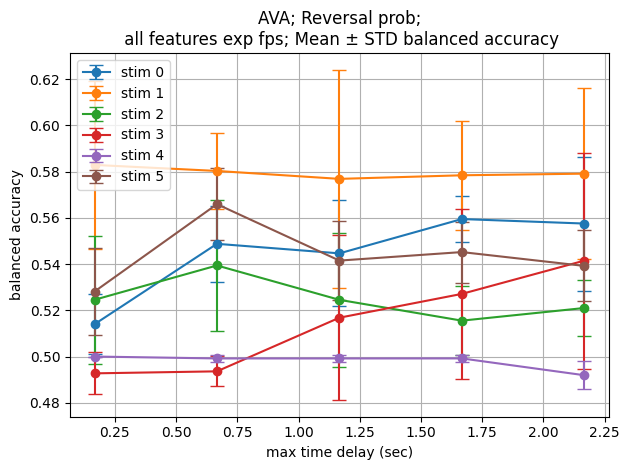

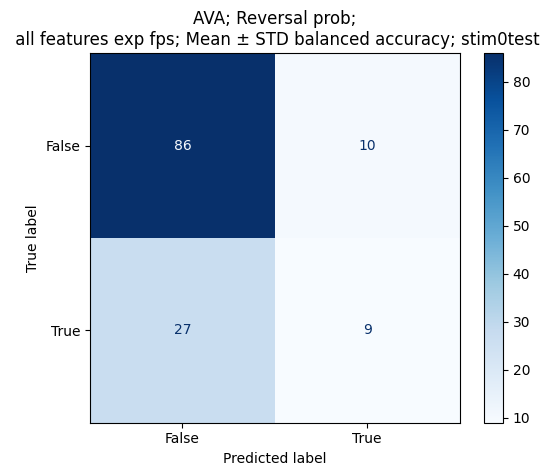

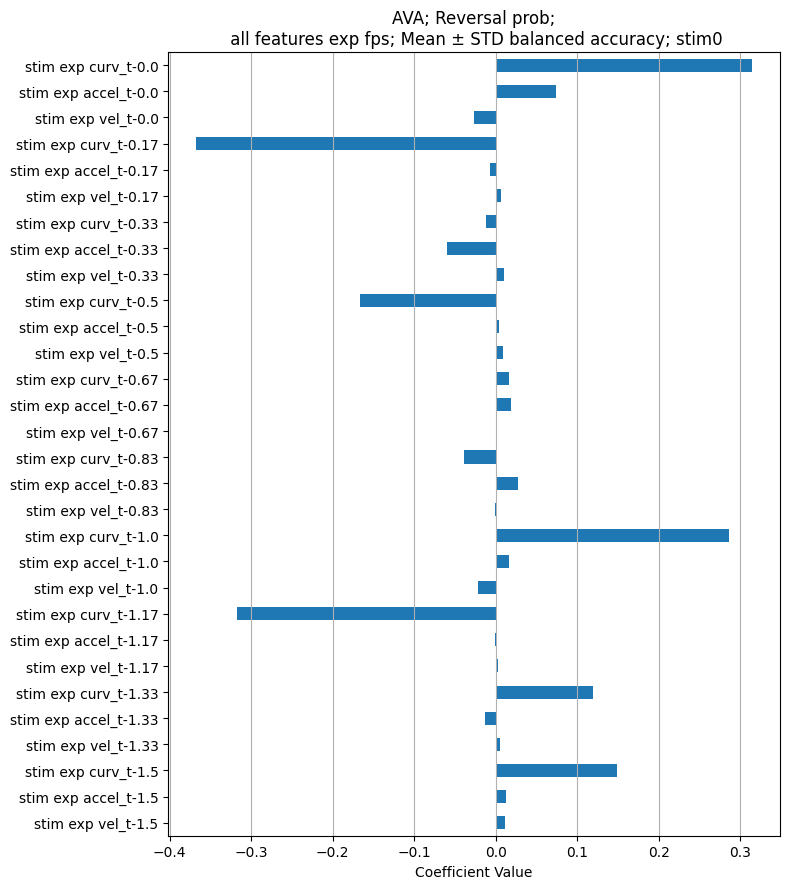

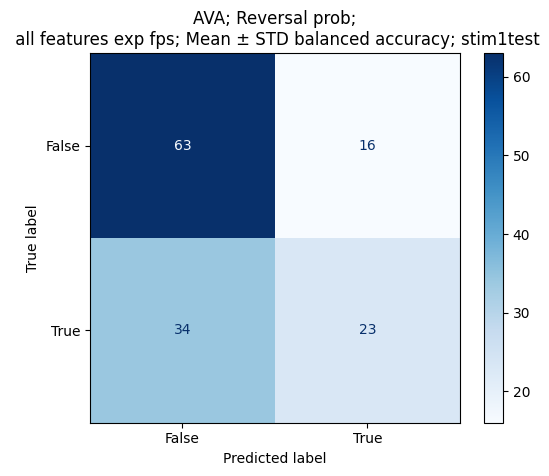

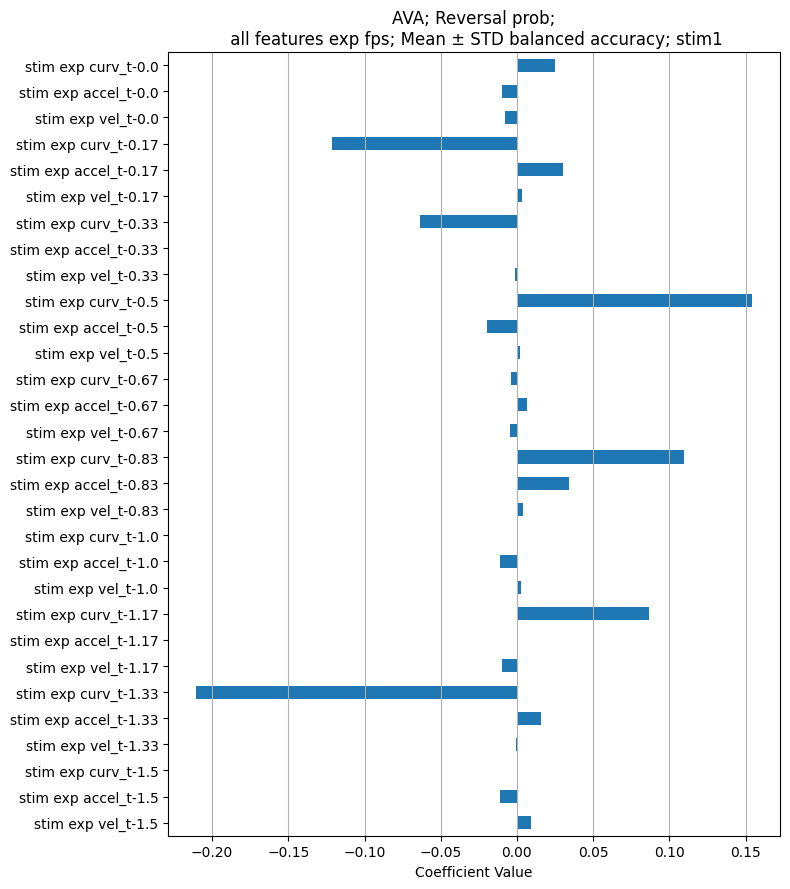

...

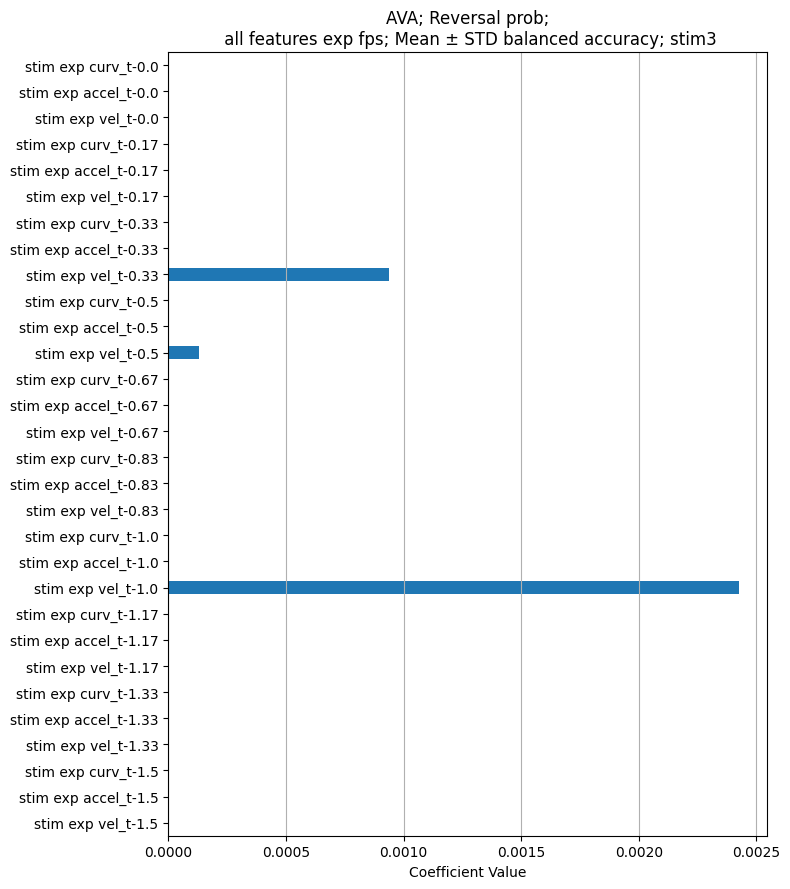

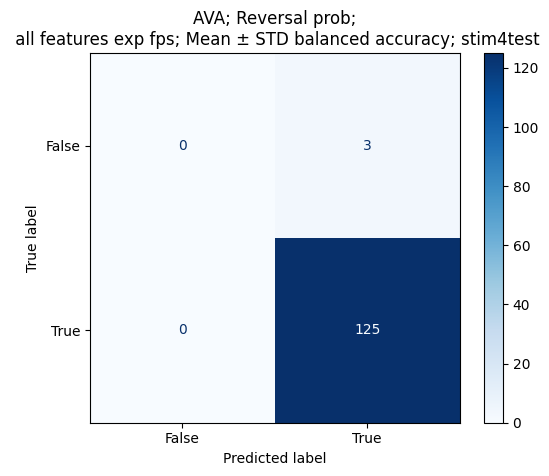

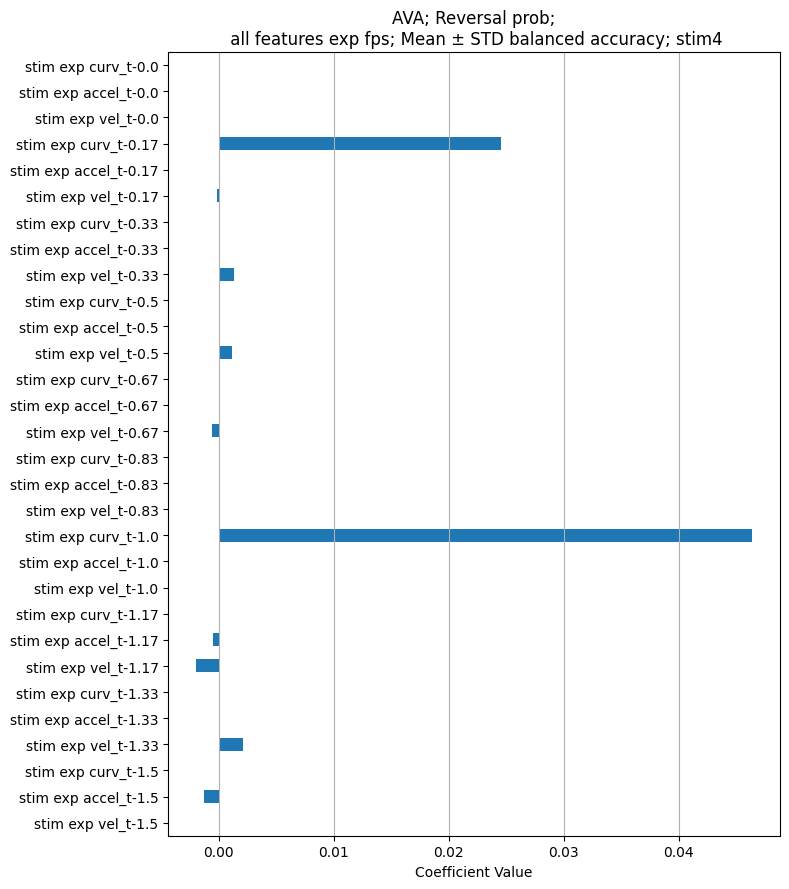

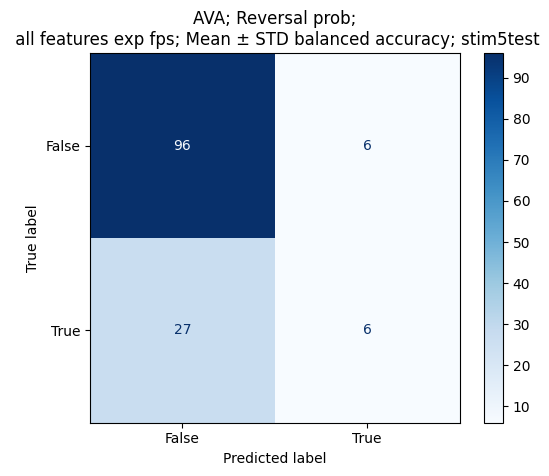

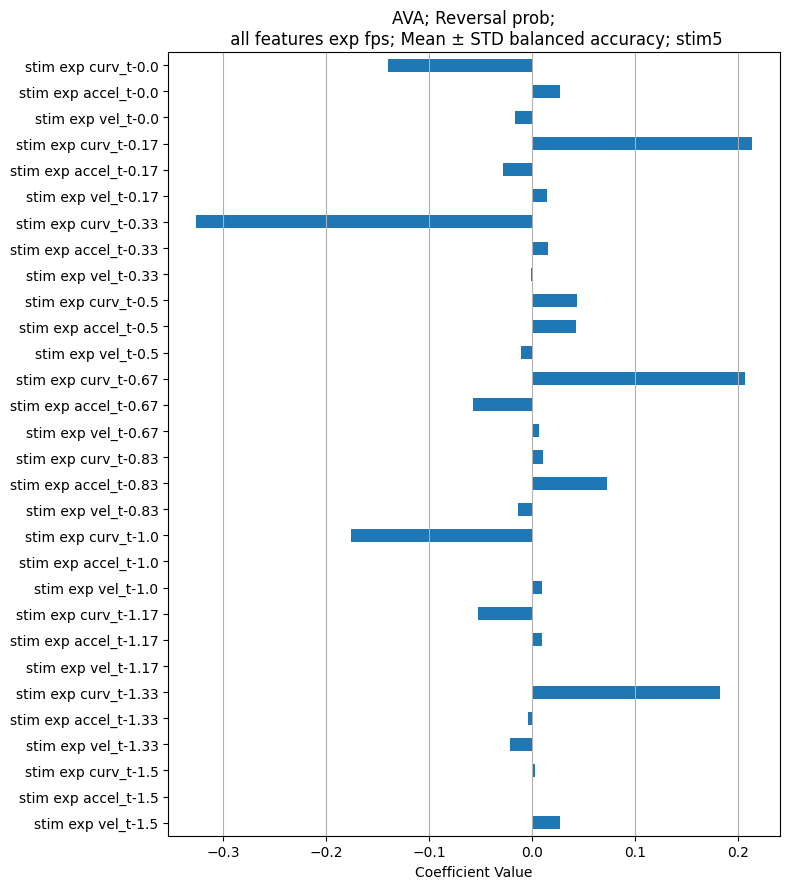

In [134]:
import torch 
from plot_donut_vs_phase import create_X_sequences

def prep_FB_inputs_select_features_only_no_onset(
                    features_list, feature_labels, 
                     n_timesteps,
                    fps = None
                   ): 
    if fps is None: 
        fps = 1

    X_all_LSTM = []
    for new_worm_idx in range(len(features_list[0])):
        X_new_worm = np.stack([feature[new_worm_idx] for feature in features_list
                                ], axis=1)  
        feature_names = np.array([[f"{lbl}_t-{np.round((n_timesteps - t - 1)/fps, 2)}" for lbl in feature_labels] for t in range(n_timesteps)]).flatten()
        X_new_tensor = torch.tensor(X_new_worm, dtype=torch.float32)
        
        if n_timesteps> 0:
            X_new_seq1 = create_X_sequences(X_new_tensor, n_timesteps).numpy() #torch.Size([475, 5, 4]), = n_frames, time delay, 4 is the feature  #
        else: 
            X_new_seq1 = X_new_tensor.numpy()

        
        
        n_frames, delay, n_features = X_new_seq1.shape
        X_new_seq1 = X_new_seq1.reshape((n_frames,  delay*n_features)) # check how this is shaped it will be f1_t-T, f2_t-T, f3_t-T, f4_t-T, ; f1_t-T+1, f2_T+1, f3_T+1 f4_T+1
        a = np.zeros((n_frames+n_timesteps,  delay*n_features))
        a[n_timesteps:] = X_new_seq1
        X_all_LSTM.append(a)
    X_all_LSTM = np.array(X_all_LSTM)

    return X_all_LSTM, feature_names


def prep_FB_inputs_select_features_only(
                    features_list, feature_labels, 
                    resampled_onset,  n_timesteps,
                    z, 
                    lstm_lag = 0,
                    stim_onset = None, fps = None
                   ): 
    # if fps is None: 
    #     fps = 1

    # X_all_LSTM = []
    # for new_worm_idx in range(len(features_list[0])):
    #     X_new_worm = np.stack([feature[new_worm_idx] for feature in features_list
    #                             ], axis=1)  
    #     feature_names = np.array([[f"{lbl}_t-{(n_timesteps - t - 1)/fps}" for lbl in feature_labels] for t in range(n_timesteps)]).flatten()
    #     X_new_tensor = torch.tensor(X_new_worm, dtype=torch.float32)
        
    #     if n_timesteps> 0:
    #         X_new_seq1 = create_X_sequences(X_new_tensor, n_timesteps).numpy() #torch.Size([475, 5, 4]), = n_frames, time delay, 4 is the feature  #
    #     else: 
    #         X_new_seq1 = X_new_tensor.numpy()
        
    #     n_frames, delay, n_features = X_new_seq1.shape
    #     X_new_seq1 = X_new_seq1.reshape((n_frames,  delay*n_features)) # check how this is shaped it will be f1_t-T, f2_t-T, f3_t-T, f4_t-T, ; f1_t-T+1, f2_T+1, f3_T+1 f4_T+1

        
    #     X_all_LSTM.append(X_new_seq1)
    # X_all_LSTM = np.array(X_all_LSTM)
    X_all_LSTM, feature_names = prep_FB_inputs_select_features_only_no_onset(
                    features_list, feature_labels, 
                     n_timesteps,
                    fps = fps
                   )

    if stim_onset is None: 
        stim_onset = resampled_onset #- lstm_lag
    X_stim_features = X_all_LSTM[:, stim_onset, :]

    return X_stim_features, feature_names


def train_model_feature_list(data_prep_fnc,
                               model_fit_fnc, 
                               result_visualization_fnc, 
                               feature_list, 
                               feature_labels,
                               z, 
                               data_onsets,
                               exp_onsets, 
                               exp_rev, 
                               durations,
                               fps,
                           
                               title_label,
                               test_size = 0.3, 
                               n_splits = 10, 
                               lstm_lag = 0, 
                               score_label = "",
                               single_feature = False, 
                               rev_bin = None, 
                               all_timesteps = None, 
                               check_warnings = True
                            ):
    if check_warnings:
        with warnings.catch_warnings():
            warnings.filterwarnings("ignore", category=ConvergenceWarning)
            fig, ax = plt.subplots()
            best_models = {} 
            all_scores_per_i = {}
            results_dict = {}
            for i, (data_onset, exp_onset) in enumerate(zip(data_onsets, exp_onsets)):
                
                onset = data_onset-1
                score_means = []
                score_stds = []
                n_timesteps_list = []
                Y_latency = latency_to_reversal(exp_rev, exp_onset, max_latency = 6*durations[i]+1)/6 # nan where not 
                # if rev_bin is not None: 
                #     fig3, ax3 = plt.subplots(figsize = (8,20))
                #     vline = onset - lstm_lag
                #     sort = np.argsort(Y_latency)
                #     ax3.imshow(rev_bin[sort, vline-25:vline+25])
                    
                #     ax3.set_title(f"onset: {onset}")
                #     ax3.axvline(25, color = "red")
                    
                
                if all_timesteps is None: 
                    all_timesteps = range(1, 15, 3)

                for n_timesteps in all_timesteps:
                    print("i, n_timesteps",i,  n_timesteps)
                    scores = []
                    models = []

                

                    X_stim_all, feature_names_all = prep_FB_inputs_select_features_only(
                        feature_list, feature_labels, onset,  n_timesteps, z, lstm_lag = lstm_lag, fps = fps
                                    )
                    
                    # X_stim_all, feature_names_all = prep_FB_inputs_select_features_only_1(feature_list, feature_labels, 
                    #                                                                                             n_timesteps, onset,
                    #                                                                                             fps = fps)
                    


                    
                    X,Y = data_prep_fnc(X_stim_all, Y_latency)



                    for split_idx in range(n_splits):
                        X_train, X_test, y_train, y_test = train_test_split(
                            X, Y, test_size=test_size, random_state=split_idx)
                        best_model, y_pred, score = model_fit_fnc(X_train, X_test, y_train, y_test)
                        scores.append(score)
                        models.append((best_model,X_train, X_test, y_train, y_test))

                    scores_mean = np.mean(scores)
                    scores_std = np.std(scores)
                    best_model_idx = np.argmax(scores)
                    best_model_overall = models[best_model_idx]

                    # Save results
                    n_timesteps_list.append(n_timesteps)
                    # all_r2_means.append(r2s)
                    all_scores_per_i[(i, n_timesteps)] = scores
                    score_means.append(scores_mean)
                    score_stds.append(scores_std)
                    results_dict[(i, n_timesteps)] = (scores_mean, scores_std)
                    best_models[(i, n_timesteps)] = best_model_overall
                    

                # cmap1 = cm.get_cmap('tab10', len(resampled_onsets))
                ax.errorbar(np.array(n_timesteps_list)/fps, score_means, yerr=score_stds, #color=cmap1(i),
                            fmt='-o', capsize=5, label = f"stim {i}")

                ax.set_title(title_label)
                ax.set_xlabel("max time delay (sec)")
                ax.set_ylabel(f"{score_label}")
                ax.legend()
                plt.grid(True)
                plt.tight_layout()


            n_timesteps = all_timesteps[-2]
            for i in range(len(exp_onsets)):
                model,X_train, X_test, y_train, y_test = best_models[(i, n_timesteps)] 

                model_label= f"{title_label}; stim{i}"#; lasso_a{np.round(alpha,2)}"
                if single_feature: 
                    feature_lbl = feature_labels[0]
                    feature_names = np.array([[f"{feature_lbl}_t-{np.round((n_timesteps - t - 1)/fps, 2)}"]
                                        for t in range(n_timesteps)]).flatten()
                    result_visualization_fnc(model, model_label, feature_names, X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = False, coeffs = model.coef_[0])#, xlim = [-2,1])
                    
                else: 
                    _,  feature_names_all = prep_FB_inputs_select_features_only(
                        # resampled_vel, resampled_acc, resampled_curve, resampled_rev, resampled_turn,
                        feature_list, feature_labels, onset,  n_timesteps, z, lstm_lag = lstm_lag,  fps = fps
                                    )
                    print("feature_names_all",feature_names_all)
                    result_visualization_fnc(model, model_label, feature_names_all, X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = False)#, xlim = [-2,1])

if experiment == "time_titration":
    durations = [1,3,5,10]
else:
    durations = [5,5,5,5,5,5]
    if experiment == "hiscl":
        durations = [5,5]
resampled_timesteps = np.arange(1,20,5)# [ 15, 20]#np.arange(1,20,5)

resampled_onsets = onsets
'''####get rev prob; all stim ; resampled  all beh feature s'''
# feature_list = stim_resampled_features# stim_matched_features #[resampled_vel, resampled_acc, resampled_curve]
# feature_labels = ["stim resamp vel", "stim resamp accel", "stim resamp curv"]
feature_labels = ["stim exp vel", "stim exp accel", "stim exp curv"]
feature_list = [stim_exp_vel, stim_exp_acc, stim_exp_curve,]

data_prep_fnc = prep_data_rev_prob
# model_fit_fnc = fit_eval_calibrated_linearSVC_with_prob
model_fit_fnc = fit_eval_linearSVC
result_visualization_fnc = visualize_model_classification
score_fnc = balanced_accuracy_score
# data_onsets = resampled_onsets
data_onsets = exp_onsets
# score_label = "balanced accuracy"
# title_label = f"{neuron}; Reversal prediction;\n resampled fps; all beh features; Mean ± STD balanced accuracy"
# fps = 1.6
title_label = f"{neuron}; Reversal prob;\n all features exp fps; Mean ± STD balanced accuracy"
fps = 6
score_label = "balanced accuracy"


train_model_feature_list(data_prep_fnc,
                               model_fit_fnc, 
                               result_visualization_fnc, 
                               feature_list, 
                               feature_labels,
                               z, 
                               data_onsets,
                               exp_onsets, 
                               stim_exp_rev, 
                               durations,
                               fps,
                           
                               title_label,
                               test_size = 0.3, 
                               n_splits = 5, 
                               lstm_lag = 0, 
                               score_label =score_label,
                               single_feature = False, 
                               rev_bin = None, 
                               all_timesteps = None, 
                               check_warnings = True
)

n_timesteps 1
split_idx 0
stimi 0
stimi 1
stimi 2
stimi 3
stimi 4
stimi 5
split_idx 1
stimi 0
stimi 1
stimi 2
stimi 3
stimi 4
stimi 5
split_idx 2
stimi 0
stimi 1
stimi 2
stimi 3
stimi 4
stimi 5
split_idx 3
stimi 0
stimi 1
stimi 2
stimi 3
stimi 4
stimi 5
split_idx 4
stimi 0
stimi 1
stimi 2
stimi 3
stimi 4
stimi 5
split_idx 5
stimi 0
stimi 1
stimi 2
stimi 3
stimi 4
stimi 5
split_idx 6
stimi 0
stimi 1
stimi 2
stimi 3
stimi 4
stimi 5
split_idx 7
stimi 0
stimi 1
stimi 2
stimi 3
stimi 4
stimi 5
split_idx 8
stimi 0
stimi 1
stimi 2
stimi 3
stimi 4
stimi 5
split_idx 9
stimi 0
stimi 1
stimi 2
stimi 3
stimi 4
stimi 5
n_timesteps 6
split_idx 0
stimi 0
stimi 1
stimi 2
stimi 3
stimi 4
stimi 5
split_idx 1
stimi 0
stimi 1
stimi 2
stimi 3
stimi 4
stimi 5
split_idx 2
stimi 0
stimi 1
stimi 2
stimi 3
stimi 4
stimi 5
split_idx 3
stimi 0
stimi 1
stimi 2
stimi 3
stimi 4
stimi 5
split_idx 4
stimi 0
stimi 1
stimi 2
stimi 3
stimi 4
stimi 5
split_idx 5
stimi 0
stimi 1
stimi 2
stimi 3
stimi 4
stimi 5
split_idx 6


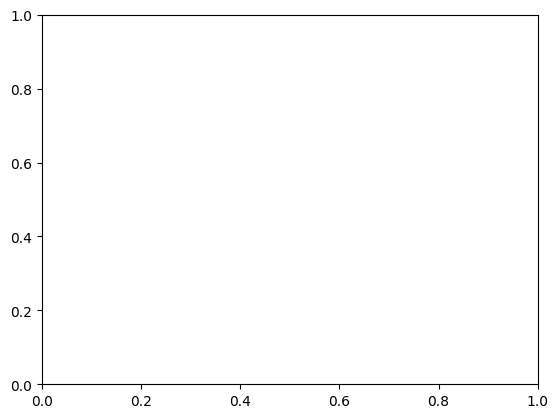

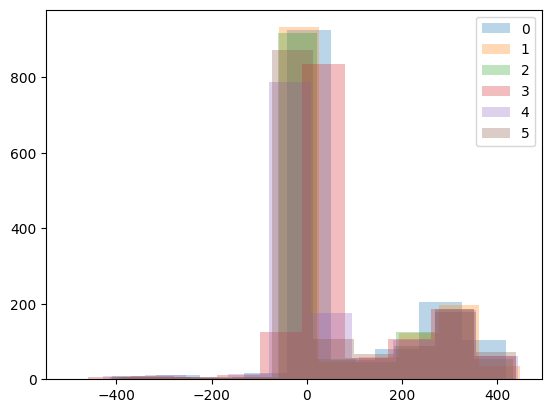

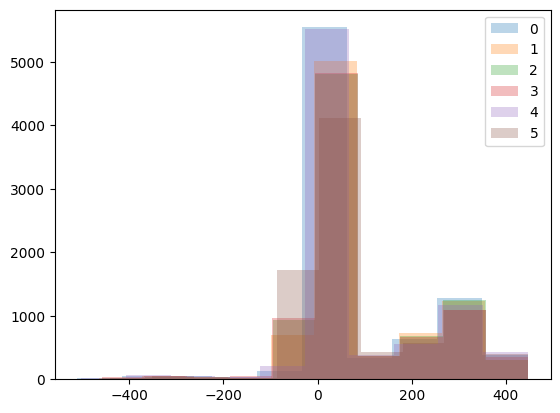

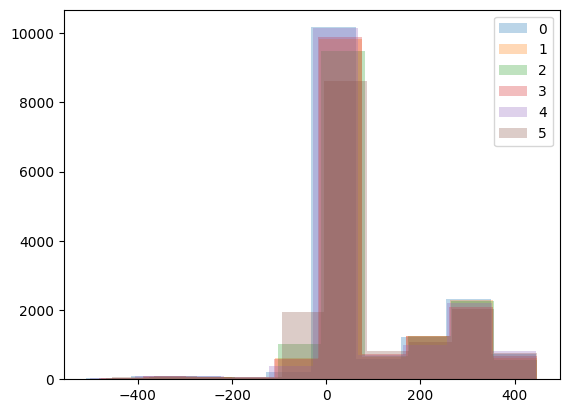

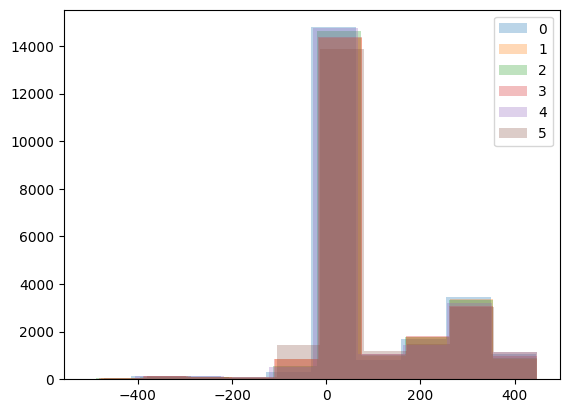

...

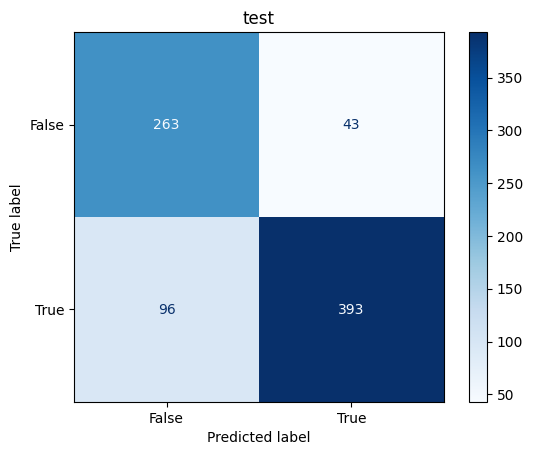

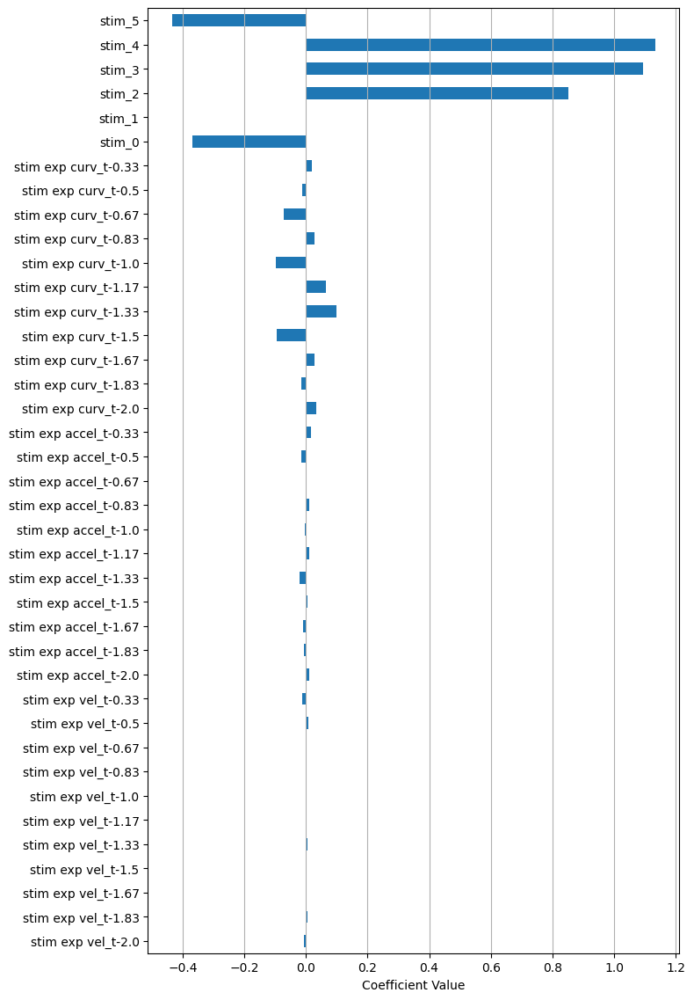

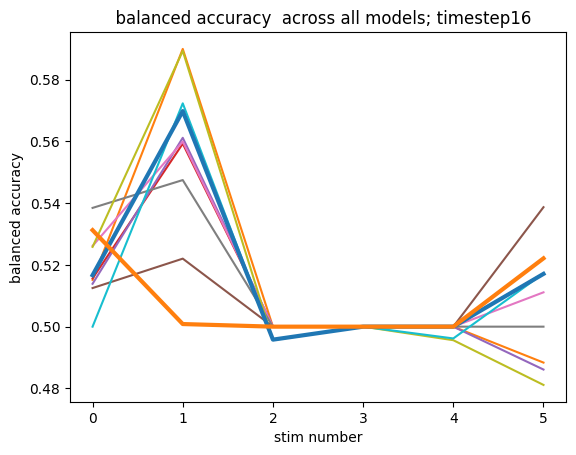

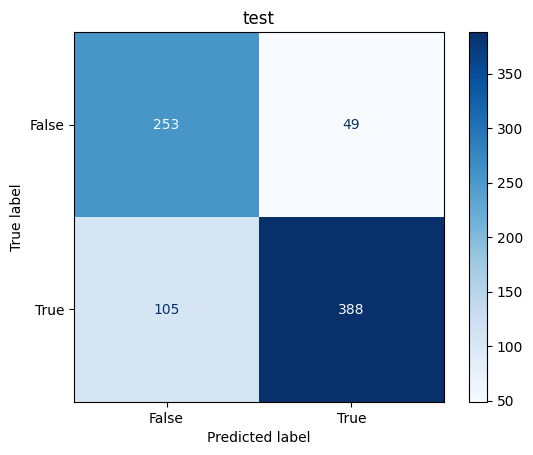

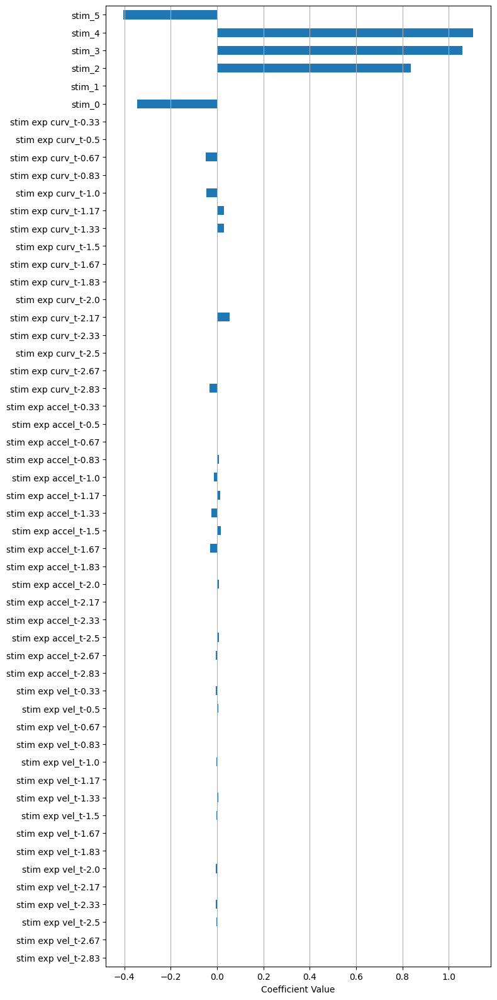

In [ ]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix




def get_plot_multi_stim_model(
                        data_prep_fnc,
                        model_fit_fnc, 
                        result_visualization_fnc, 
                        feature_list, 
                        feature_labels,
                        z, 
                        data_onsets,
                        exp_onsets, 
                        exp_rev, 
                        durations,
                        fps,
                        score_fnc, 
                        # title_label,
                        test_size = 0.3, 
                        n_splits = 5, 
                        lstm_lag = 0, 
                        get_coeffs = True, 
                        title_label = "", 
                        all_timesteps = None, 
                        check_warnings = True, 
                        visualize_individ_stim = False, 
                        score_label = ""
                        
        ):
        
        with warnings.catch_warnings():
                warnings.filterwarnings("ignore", category=ConvergenceWarning)
                if all_timesteps is None: 
                        all_timesteps = np.arange(1, 15, 3)

                
                results_dict_score_overall = {}
                best_models_score_overall ={}
                results_dict_score_stim ={}
                best_models_score_stim = {}

                
                t_to_all_data = {}
                t_to_all_feature_names ={}
                t_to_all_models = {}
                t_to_all_stim_scores ={}
                t_to_best_model_using_min_idx_score ={}
                
                # n_timesteps_list = []

                t_to_best_model_idx_score = {}
                        

                fig, ax = plt.subplots()
                ax.set_title(f"{title_label}")
                best_models = {} 
                all_scores_per_i = {}
                results_dict = {}
                for n_timesteps in all_timesteps:
                        
                        print("n_timesteps", n_timesteps)
                        all_data = []
                        n_stim = len(data_onsets)
                        # stim_i_to_score_means = {i:[] for i in range(n_stim)}
                        # stim_i_to_score_stds = {i:[] for i in range(n_stim)}
                        
                        stim_i_to_Xs = {}
                        stim_i_to_Ys = {}
                        fig6, ax6 = plt.subplots()
                        for i, (data_onset, exp_onset) in enumerate(zip(data_onsets, exp_onsets)):
                                onset = data_onset-1
                                score_means = []
                                score_stds = []
                                # n_timesteps_list = []
                                Y_latency = latency_to_reversal(exp_rev, exp_onset, max_latency = 6*durations[i]+1)/6 # nan where not 
                                # a =np.zeros(feature_list[0].shape)
                                # b =np.ones(feature_list[0].shape)*-1
                                # for i in range(n_timesteps+1):
                                        
                                #         a[:,(onset-i) ] = i 
                                #         b[:,(onset-i) ] = i 
                                # feature_list = [a, b ]
                                X_stim_all, feature_names_all = prep_FB_inputs_select_features_only_1(feature_list, feature_labels, 
                                                                                                                n_timesteps, onset,
                                                                                                                fps = fps)

                                X_stim_all, feature_names_all = prep_FB_inputs_select_features_only(
                                feature_list, feature_labels, onset,  n_timesteps, z, lstm_lag = lstm_lag, fps = fps
                                                )
                                
                                ax6.hist(X_stim_all.flatten(), label = f"{i}", alpha = 0.3)
                                # print("feature_labels", feature_labels)
                                X,Y = data_prep_fnc(X_stim_all, Y_latency)
                                
                                stim_i_to_Xs[i] = X
                                stim_i_to_Ys[i] = Y
                                # print("i, n_timesteps",i,  n_timesteps)
                                # print("i, X.shape", i, X.shape)
                                scores = []
                                models = []
                        ax6.legend()

                        all_stim_X_stim_features, all_stim_Y, feature_names_all = combine_FB_features_across_stim(stim_i_to_Xs, stim_i_to_Ys,  feature_names_all)
                        t_to_all_feature_names[n_timesteps] = feature_names_all
                        overall_scores = []
                        all_stim_scores =[]# np.zeros((n_splits,n_stim))
                        best_model_idx = []
                        models = [] # n_splits

                        
                        
                        for split_idx in range(n_splits):
                                print("split_idx", split_idx)
                                X_train, X_test, y_train, y_test = train_test_split(all_stim_X_stim_features, all_stim_Y,  test_size=test_size, random_state=split_idx)
                                all_data.append((X_train, X_test, y_train, y_test))

                                #get best model over all stim 
                                best_model, y_pred, score = model_fit_fnc(X_train, X_test, y_train, y_test)
                                scores.append(score)
                                models.append(best_model)#,X_train, X_test, y_train, y_test))

                                scores_mean = np.mean(scores)
                                scores_std = np.std(scores)
                                best_model_idx = np.argmax(scores)
                                best_model_overall = models[best_model_idx]
                                
                                
                                #get stim_i for each row in test data
                                stim_bin_test = X_test[:, -1*n_stim:]
                                stim_i_test = np.argmax(stim_bin_test, axis = 1)
                                stim_scores = [] #model specfic for each stim 
                                # all_X_stim = []
                                # all_y_stim = []
                                all_conf = np.zeros((2,2))
                                y_pred = best_model.predict(X_test)
                                for j in range(n_stim):
                                        print("stimi", j)
                                        X_test_stim = X_test[stim_i_test == j, :]
                                        # print(j, "X_tesX_test_stimt.shape)", X_test_stim.shape)
                                        y_test_stim = y_test[stim_i_test == j]
                                        # print(X_test_stim[:, -1])
                                        # print(X_test_stim[:, -2])
                                        # print(X_test_stim[:, -3])
                                        # print(X_test_stim[:, -4])
                                        # print(X_test_stim[:, -5])
                                        y_pred = best_model.predict(X_test_stim)
                                        stim_score = score_fnc(y_test_stim, y_pred)  
                                        # print("stim accuracy_score", j, accuracy_score(y_test_stim, y_pred))
                                        all_conf = all_conf+confusion_matrix(y_test_stim, y_pred)
                                        stim_scores.append(stim_score)
                                        # all_X_stim.append(X_test_stim)
                                        # all_y_stim.append(y_test_stim)
                                # all_X_stim = np.concatenate(all_X_stim, axis = 0)
                                # print( "all_X_stim.shape)", all_X_stim.shape)
                                # all_y_stim = np.concatenate(all_y_stim)
                                
                                # # y_pred = best_model.predict(all_X_stim)
                                # overall_score = score_fnc(y_test, y_pred) 
                                # print("####################")
                                # print("overall accuracy_score", accuracy_score(y_test, y_pred))
                                # print("overallbalacened_score", overall_score)
                                # print(confusion_matrix(y_test, y_pred))
                                # print("all_conf",all_conf )
                                
                                all_stim_scores.append(stim_scores)
                                # print(split_idx, "stim_scores", stim_scores)
                                y_pred = best_model.predict(X_test)
                                # print( "X_test1.shape)", X_test.shape)
                                overall_score = score_fnc(y_test, y_pred) ###
                                # print("overall accuracy_score1", accuracy_score(y_test, y_pred))
                                # print("overallbalacened_score1", overall_score)
                                # print(confusion_matrix(y_test, y_pred))
                                # print("####################")
                                
                                
                                overall_scores.append(overall_score)
                                models.append(best_model)
                                

                                # Save results
                                # n_timesteps_list.append(n_timesteps)
                                # all_r2_means.append(r2s)
                                all_scores_per_i[(i, n_timesteps)] = scores
                                score_means.append(scores_mean)
                                score_stds.append(scores_std)
                                results_dict[(i, n_timesteps)] = (scores_mean, scores_std)
                                best_models[(i, n_timesteps)] = best_model_overall
                        # fig5, ax5 = plt.subplots()
                        # ax5.hist(all_stim_X_stim_features[:, :n_timesteps].flatten(), alpha = 0.5, label ="xtrain", density = True)
                        # ax5.hist(X_train[:, :n_timesteps].flatten(), alpha = 0.5, label ="xtrain", density = True)
                        # ax5.hist(X_test[:, :n_timesteps].flatten(), alpha = 0.5, label ="xtrain", density = True)
                        # ax5.hist(feature_list[0].flatten(), alpha = 0.5, label ="list", density = True)
                        # # ax5.hist(all_stim_Y.flatten(), alpha = 0.5, label ="xtest", density = True)
                        # ax5.legend()
                        
                        
                        all_stim_scores = np.array(all_stim_scores)#n_splits,n_stim
                        t_to_all_models[ n_timesteps] = models
                        
                        
                        ###overall scores
                        accuracy_mean_overall = np.mean(overall_scores)
                        
                        accuracy_std_overall= np.std(overall_scores)
                        # print("overall_scores", overall_scores)
                        # print("accuracy_mean_overall", accuracy_mean_overall)
                        # print("accuracy_std_overall", accuracy_std_overall)
                        
                        best_model_idx_score_overall = np.argmax(overall_scores)
                        # np.argmin(overall_scores)
                        best_model_score_overall = models[best_model_idx_score_overall]
                        t_to_best_model_idx_score[n_timesteps] = best_model_idx_score_overall
                        
                        results_dict_score_overall[n_timesteps] = (accuracy_mean_overall, accuracy_std_overall)
                        best_models_score_overall[ n_timesteps] = best_model_score_overall
                        
                        #####stim scores
                        accuracy_mean_stim_specific = np.mean(all_stim_scores, axis =0)
                        accuracy_std_stim_specific = np.std(all_stim_scores, axis =0)

                        
                        best_model_idx_score_stim_min = np.argmax(np.min(all_stim_scores, axis = 1)) # has lowest min on all stim 
                        best_model_score_stim_min = models[best_model_idx_score_stim_min]
                        t_to_best_model_using_min_idx_score[n_timesteps] = best_model_idx_score_stim_min
                        

                        results_dict_score_stim[n_timesteps] = (accuracy_mean_stim_specific, accuracy_std_stim_specific)
                        best_models_score_stim[ n_timesteps] = best_model_score_stim_min
                        
                                        
                        t_to_all_stim_scores[n_timesteps] = all_stim_scores
                        t_to_all_data[n_timesteps] = all_data
                        

                        # n_timesteps_list.append(n_timesteps)
                ####plot overall mean and std overall and for each stim  
                fig, ax = plt.subplots()
                accuracy_mean_overall_over_t = []
                accuracy_std_overall_over_t = []
                stim_acc_mean_over_t = []
                stim_acc_std_over_t = []
                for n_timesteps in all_timesteps:

                        accuracy_mean_overall, accuracy_std_overall = results_dict_score_overall[n_timesteps]
                        accuracy_mean_overall_over_t.append(accuracy_mean_overall)
                        accuracy_std_overall_over_t.append(accuracy_std_overall)
                        accuracy_mean_stim_specific, accuracy_std_stim_specific = results_dict_score_stim[n_timesteps]
                        stim_acc_mean_over_t.append(accuracy_mean_stim_specific)
                        stim_acc_std_over_t.append(accuracy_std_stim_specific)
                # print(n_timesteps_list)/
                stim_acc_mean_over_t = np.array(stim_acc_mean_over_t)
                stim_acc_std_over_t = np.array(stim_acc_std_over_t)
                for j in range(n_stim):
                        ax.errorbar(np.array(all_timesteps)/fps, stim_acc_mean_over_t[:,j], yerr=stim_acc_std_over_t[:,j], fmt='-o', capsize=5, label = f"stim {j}")#color=cmap1(i),
                        
                ax.errorbar(np.array(all_timesteps)/fps, accuracy_mean_overall_over_t, yerr=accuracy_std_overall_over_t, #color=cmap1(i),
                                fmt='-o', capsize=5, label = f"overall")
                ax.set_title(f'{title_label} mean {score_label} performance over models for given stim ')
                ax.set_ylabel(f" {score_label} ")
                ax.set_xlabel("max time delay (s)")
                ax.legend()
                
                
                ####plot score overall score on each stim (each line a model)
                for n_timesteps in all_timesteps:
                        all_stim_scores = t_to_all_stim_scores[n_timesteps]
                        
                        fig, ax = plt.subplots()
                        for k in range(n_splits): 
                                ax.plot(np.arange(n_stim), all_stim_scores[k])
                        ax.set_title(f" {title_label} {score_label}  across all models; timestep{n_timesteps}")
                        ax.set_xlabel("stim number")
                        ax.set_ylabel(f"{score_label}")
                        idx = t_to_best_model_idx_score[n_timesteps]
                        ax.plot(np.arange(n_stim), all_stim_scores[idx], linewidth = 3, label = "best")
                        
                        idx = t_to_best_model_using_min_idx_score[n_timesteps]
                        ax.plot(np.arange(n_stim), all_stim_scores[idx], linewidth = 3, label = "best using min")
                        X_train, X_test, y_train, y_test = t_to_all_data[n_timesteps][idx]
                        # best_model,X_train, X_test, y_train, y_test = best_models_score_stim[n_timesteps] 
                        result_visualization_fnc(best_models_score_stim[n_timesteps] , f"{title_label}", t_to_all_feature_names[n_timesteps], X_train, X_test, y_train, y_test, n_timesteps,  feature_names_ordered = False, get_coeffs = get_coeffs)#, xlim = [-2,1])
                        stim_bin_test = X_test[:, -1*n_stim:]
                        stim_i_test = np.argmax(stim_bin_test, axis = 1)
                        
                        stim_bin_train = X_train[:, -1*n_stim:]
                        stim_i_train = np.argmax(stim_bin_train, axis = 1)
                        # print(stim_i_train.shape)
                        # print()
                        # print("stim_i_test", stim_i_test)
                        if visualize_individ_stim:
                                for j in range(n_stim):
                                                
                                        X_test_stim = X_test[stim_i_test == j, :]
                                        y_test_stim = y_test[stim_i_test == j]
                                        X_train_stim = X_train[stim_i_train == j, :]
                                        y_train_stim = y_train[stim_i_train == j]
                                        
                                        result_visualization_fnc(best_models_score_stim[n_timesteps] , f"{title_label}; stim: {j}", t_to_all_feature_names[n_timesteps], X_train_stim, X_test_stim, y_train_stim, y_test_stim, n_timesteps,  feature_names_ordered = False, get_coeffs = False)#, xlim = [-2,1])
                                        
                        
        return best_models_score_stim, t_to_best_model_using_min_idx_score, t_to_all_data, t_to_all_feature_names

def get_plot_multi_stim_model_single_feature(
                        data_prep_fnc,
                        model_fit_fnc, 
                        result_visualization_fnc, 
                        feature_list, 
                        feature_labels,
                        z, 
                        data_onsets,
                        exp_onsets, 
                        exp_rev, 
                        durations,
                        fps,

                        # title_label,
                        score_fnc,
                        test_size = 0.3, 
                        n_splits = 5, 
                        lstm_lag = 0, 
                        
                        all_timesteps = None, 
                        check_warnings = True, 
                        score_label = "", 
                        visualize_individ_stim = False, 
                        get_coeffs = True,
        ):
        
    feature_to_best_models = {}

    for feature, feature_lbl in zip(feature_list, feature_labels
                                                    ):
        
        single_feature_list = [feature]
        single_feature_labels = [feature_lbl]
        best_model_score_stim, t_to_best_model_using_min_idx_score, t_to_all_data, t_to_all_feature_names = get_plot_multi_stim_model(
                        data_prep_fnc,
                        model_fit_fnc, 
                        result_visualization_fnc, 
                        single_feature_list, 
                        single_feature_labels,
                        z, 
                        data_onsets,
                        exp_onsets, 
                        exp_rev, 
                        durations,
                        fps,
                        score_fnc, 

                        title_label = f"{feature_lbl}", 
                        test_size =test_size, 
                        n_splits = n_splits, 
                        lstm_lag = lstm_lag, 
                        
                        all_timesteps = all_timesteps, 
                        check_warnings = check_warnings, 
                        score_label = score_label, 
                        visualize_individ_stim = visualize_individ_stim, get_coeffs = get_coeffs
        )
        feature_to_best_models[feature_lbl] = [best_model_score_stim, t_to_best_model_using_min_idx_score, t_to_all_data, t_to_all_feature_names]
        
    return feature_to_best_models
    

from sklearn.calibration import CalibratedClassifierCV
def fit_eval_calibrated_linearSVC_with_prob(X_train, X_test, y_train, y_test):
    
    param_grid = {
        'C': [0.001, 0.01, 0.1, 1, 10, 100]
    }

    model = LinearSVC(penalty='l1', dual=False, max_iter=10000)
    # Grid search
    grid = GridSearchCV(model, param_grid, cv=5, scoring='balanced_accuracy')
    grid.fit(X_train, y_train)
    c = grid.best_params_['C']
    best_model = grid.best_estimator_
#     coef = best_model.coef_
#     print("coef, ", coef)
    # y_pred = best_model.predict(X_test)
    # score = balanced_accuracy_score(y_test, y_pred)  

    calibrated_svc = CalibratedClassifierCV(best_model, method='isotonic', cv=5)
    calibrated_svc.fit(X_train, y_train)
    y_pred = best_model.predict(X_test)
    score = balanced_accuracy_score(y_test, y_pred)  
    # probabilities = calibrated_svc.predict_proba(X)

    return calibrated_svc, y_pred, score



if experiment == "time_titration":
    durations = [1,3,5,10]
else:
    durations = [5,5,5,5,5,5]
    if experiment == "hiscl":
        durations = [5,5]
resampled_timesteps = np.arange(1,20,5)# [ 15, 20]#np.arange(1,20,5)

resampled_onsets = onsets
'''####get rev prob; all stim ; resampled  all beh feature s'''
# feature_list = stim_resampled_features# stim_matched_features #[resampled_vel, resampled_acc, resampled_curve]
# feature_labels = ["stim resamp vel", "stim resamp accel", "stim resamp curv"]
feature_labels = ["stim exp vel", "stim exp accel", "stim exp curv"]
feature_list = [stim_exp_vel, stim_exp_acc, stim_exp_curve,]

data_prep_fnc = prep_data_rev_prob
# model_fit_fnc = fit_eval_calibrated_linearSVC_with_prob
model_fit_fnc = fit_eval_linearSVC
result_visualization_fnc = visualize_model_classification
score_fnc = balanced_accuracy_score
# data_onsets = resampled_onsets
data_onsets = exp_onsets
# score_label = "balanced accuracy"
# title_label = f"{neuron}; Reversal prediction;\n resampled fps; all beh features; Mean ± STD balanced accuracy"
# fps = 1.6
title_label = f"{neuron}; Reversal prob;\n all features exp fps; Mean ± STD balanced accuracy"
fps = 6
score_label = "balanced accuracy"

best_models_score_stim, t_to_best_model_using_min_idx_score, t_to_all_data, t_to_all_feature_names  = get_plot_multi_stim_model(
                                                    data_prep_fnc,
                                                    model_fit_fnc, 
                                                    result_visualization_fnc, 
                                                    feature_list, 
                                                    feature_labels,
                                                    z, 
                                                    data_onsets,
                                                    exp_onsets, 
                                                    stim_exp_rev, 
                                                    durations,
                                                    fps,
                                                    # title_label,
                                                    score_fnc, 
                                                    test_size = 0.3, 
                                                    n_splits = 10, 
                                                    lstm_lag = 0, 
                                                    score_label=score_label, 
                                                    visualize_individ_stim = False, 
                                                #     get_coeffs = False,
                                                 get_coeffs = True,

                                                    all_timesteps = resampled_timesteps, 
                                                    check_warnings = True
                                                                        )


# feature_to_best_models = get_plot_multi_stim_model_single_feature(
#                                                     data_prep_fnc,
#                                                     model_fit_fnc, 
#                                                     result_visualization_fnc, 
#                                                     feature_list, 
#                                                     feature_labels,
#                                                     z, 
#                                                     data_onsets,
#                                                     exp_onsets, 
#                                                     stim_exp_rev, 
#                                                     durations,
#                                                     fps,
#                                                     # title_label,
#                                                     score_fnc, 
#                                                     test_size = 0.3, 
#                                                     n_splits = 10, 
#                                                     lstm_lag = 0, 
#                                                     score_label=score_label, 
#                                                     visualize_individ_stim = False, 
#                                                     get_coeffs = False,

#                                                     all_timesteps = resampled_timesteps, 
#                                                     check_warnings = True
#         )




In [ ]:



n_timesteps = 15    


for i, (data_onset, exp_onset) in enumerate(zip(data_onsets, exp_onsets)):
    onset = exp_onset
    a =np.zeros(feature_list[0].shape)
    b =np.ones(feature_list[0].shape)*-1
    for i in range(n_timesteps+1):
            
            a[:,(onset-i) ] = i 
            b[:,(onset-i) ] = i 
    feature_list = [a, b ]
    X_stim_all, feature_names_all = prep_FB_inputs_select_features_only_1(feature_list, feature_labels, 
                                                                                    n_timesteps, onset,
                                                                                    fps = fps)
    
    X_stim_all1, feature_names_all1 = prep_FB_inputs_select_features_only(
    feature_list, feature_labels, onset,  n_timesteps, z, lstm_lag = 0, fps = fps
                    )
    
    print()
    break

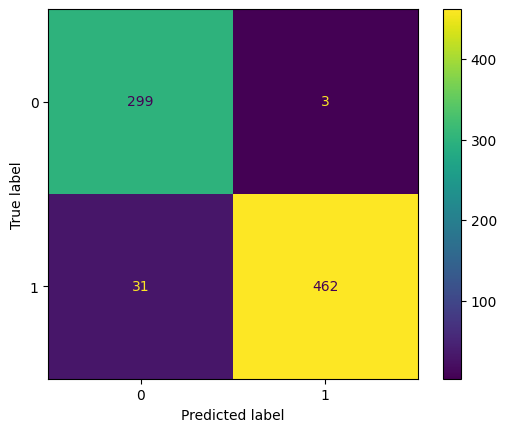

In [102]:
n_timesteps = 20 

best_model_score_stim, t_to_best_model_using_min_idx_score, t_to_all_data, t_to_all_feature_names = feature_to_best_models[feature_labels[0]]
idx = t_to_best_model_using_min_idx_score[n_timesteps]
model = best_model_score_stim[n_timesteps]
X_train, X_test, y_train, y_test = t_to_all_data[n_timesteps][idx]


y_pred = model.predict(X_test)

cm = confusion_matrix(y_test, y_pred)

disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot()

(1, 26)
(1, 26)
(1, 26)
(1, 26)
(1, 26)
(1852, 26)


(array([ 964., 2240., 1365.,  723.,  513., 5440., 1677., 3086., 3816.,
         846.]),
 array([-510.88873291, -415.08671875, -319.28470459, -223.48269043,
        -127.68067627,  -31.87866211,   63.92335205,  159.72536621,
         255.52738037,  351.32939453,  447.13140869]),
 <BarContainer object of 10 artists>)

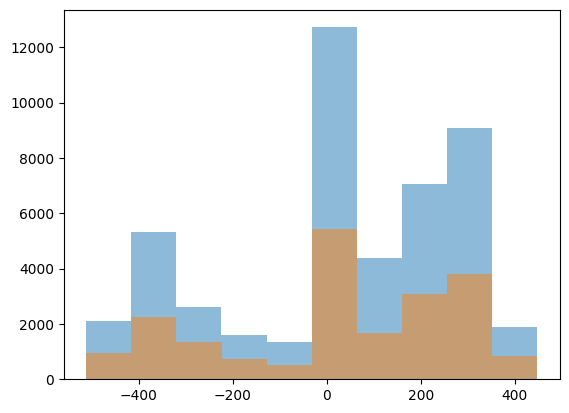

In [ ]:


best_model_score_stim, t_to_best_model_using_min_idx_score, t_to_all_data, t_to_all_feature_names = feature_to_best_models["stim exp vel"] 
n_timesteps = 20
calibrated_svc = best_model_score_stim[n_timesteps] 
idx = t_to_best_model_using_min_idx_score[n_timesteps]
X_train, X_test, y_train, y_test = t_to_all_data[n_timesteps][idx]
for i, calibrated in enumerate(calibrated_svc.calibrated_classifiers_):
    coef = calibrated.estimator.coef_
    print(coef.shape)
    
print(X_train.shape)
calibrated_svc.predict_proba(X_train)

fig, ax = plt.subplots()
ax.hist(X_train.flatten(), alpha = 0.5, label ="xtrain")
ax.hist(X_test.flatten(), alpha = 0.5, label ="xtest")


In [ ]:
# from spont_rev_prediction_fncs import plot_mean_line_graph_with_individ_traces


# def filter_start_ends_is_by_feature(track_start_end_is, feature_mat,  feature_min, feature_max):
#     valid_is = []
#     for i, (track, start, end) in enumerate(track_start_end_is):
#         feature_val = feature_mat[track, start:end]
#         if np.logical_and(feature_val>=feature_min, feature_val<feature_max ):
#             valid_is.append(i)
#     return track_start_end_is[valid_is, :]

# def filter_start_ends_is_by_feature(X_vals, feature_seq,  feature_min, feature_max):  ###get X_vals from other times.. 
#     valid_is = np.argwhere(np.logical_and(feature_seq>=feature_min, feature_seq<feature_max )).flatten()
#     return valid_is

# def get_rev_probs_from_track_start_end_is(X_vals, prob_model):
#     probs = prob_model.predict_proba(X_vals)
#     return probs





# resampled_timesteps = [ 10, 15]#np.arange(1,20,5)

# # # feature_list = stim_resampled_features# stim_matched_features #[resampled_vel, resampled_acc, resampled_curve]
# # # feature_labels = ["stim resamp vel", "stim resamp accel", "stim resamp curv"]
# # feature_labels = ["stim exp vel", "stim exp accel", "stim exp curv"]
# # feature_list = [stim_exp_vel, stim_exp_acc, stim_exp_curve,]

# data_prep_fnc = prep_data_rev_prob
# model_fit_fnc = fit_eval_calibrated_linearSVC_with_prob
# result_visualization_fnc = visualize_model_classification
# score_fnc = balanced_accuracy_score
# # data_onsets = resampled_onsets
# data_onsets = exp_onsets

# fps = 6




# all_data = []
# n_stim = len(data_onsets)
# prob_model = calibrated_svc
# # stim_i_to_score_means = {i:[] for i in range(n_stim)}
# # stim_i_to_score_stds = {i:[] for i in range(n_stim)}


# # resampled_timesteps = [1, 5, 10]#np.arange(1,20,5)

# resampled_onsets = onsets
# '''####get rev prob; all stim ; resampled  all beh feature s'''

# title_label = f"{neuron}; Reversal prediction;\n resampled fps; all beh features; Mean ± STD balanced accuracy"



# # fps = 6
# dt = 1/fps
# n_pre_stim_frames = n_timesteps
# n_post_stim_frames = int(fps*10)

# latency_mins = np.arange(0, int(5*fps))#[::15]#[-5:]
# # print(latency_mins)
# latency_maxs = latency_mins+1

# # latency_mins = [-1]
# # latency_maxs = [np.inf]
# prob_mins = np.arange(0,1.1, 0.1 )[:-1]
# prob_maxs =  np.arange(0,1.1, 0.1 )[1:]

# prob_mins = [-1]
# prob_maxs = [np.inf]
# lstm_lag = 0

# stim_i_to_Xs = {}
# stim_i_to_model_Xs = {}
# for i, (data_onset, exp_onset) in enumerate(zip(data_onsets, exp_onsets)):
#         onset = data_onset-1
#         score_means = []
#         score_stds = []

#         Y_latency = latency_to_reversal(stim_exp_rev, exp_onset, max_latency = 6*durations[i]+1)/6 
#         X_all_LSTM, feature_names = prep_FB_inputs_select_features_only_no_onset(
#                 [feature_list[0]], [feature_labels[0]], 
#                      n_pre_stim_frames+n_post_stim_frames,
#                 fps = 1
#                 )
#         # prep_data_rev_prob(X_stim_all, Y_latency)
#         X_all_LSTM,Y_latency = prep_data_rev_prob(X_all_LSTM, Y_latency)
#         # print(feature_names)
#         X_stim_features = X_all_LSTM[:,data_onset+n_post_stim_frames, :]
#         stim_i_to_Xs[i] = X_stim_features
#         n_pts = X_stim_features.shape[0]
#         stim_arr = np.zeros((n_pts, n_stim))
#         stim_arr[:, i]=1
#         stim_i_to_model_Xs[i] = np.concatenate([X_stim_features[:, 0:n_pre_stim_frames],stim_arr], axis = 1) # check that this is first however many not last hoever many
#         print(feature_names[0:n_pre_stim_frames])
#         # print(feature_names[n_pre_stim_frames:])
        
        
#         model_X, Y_latency, no_rev_at_onset= prep_data_rev_prob_1(model_X, Y_latency)
#         # probs = get_rev_probs_from_track_start_end_is(stim_i_to_model_Xs[i] , prob_model)[:,0]
#         probs = prob_model.predict_proba(stim_i_to_model_Xs[i])[:,0]
#         y_pred = prob_model.predict(stim_i_to_model_Xs[i])
#         fig, ax = plt.subplots()
#         ax.hist(probs)
#         ax.set_title(f"probs stim  {i}")
        
#         for probs_min, probs_max in zip(prob_mins,prob_maxs):
#             for latency_min ,latency_max in zip(latency_mins, latency_maxs):
#                 valid_is = np.logical_and(
#                                     np.logical_and(probs>=probs_min, probs<probs_max), 
#                                     np.logical_and(Y_latency>=latency_min, Y_latency<latency_max)
#                             )
#                 if valid_is.size ==0:
#                     continue
#                 X_to_plot = stim_i_to_Xs[i][valid_is]
#                 # for i, (feature, feature_lbl) in enumerate(zip(feature_list, feature_labels)):
#                 feature_lbl = feature_labels[0]
#                 fig, ax1 = plt.subplots()
#                 stim_aligned_feature = X_to_plot
#                 # plot_mean_line_graph_with_individ_traces(stim_aligned_feature, n_pre_stim_frames, fps = fps,  fig = fig, ax =ax1 , seconds = None, 
#                 #                                     #    title = f"stim: {i}; latency: {np.round(latency_min*dt,2)}; dur: {np.round(rev_duration_min*dt,2)}", 
#                 #                                         title = f"stim: {i}; prob: {np.round(probs_min,2),np.round(probs_max,2) },\n latency: {np.round(latency_min*dt,2)}", # dur: {np.round(rev_duration_min*dt,2)}", 
#                 #                                         xlabel ="seconds post-stim start", 
#                 #                                         ylabel =f"{feature_lbl}", color = "blue", ylim =None,  ylabel_font_size = 8, 
#                 #                                         max_n_tracks = 30,line_width=1.0, 
                                                        
#                 #                                         )
#                 dt = 1
#                 fps = 1
#                 plot_mean_line_graph_with_individ_traces(stim_aligned_feature, n_pre_stim_frames, fps = 1,  fig = fig, ax =ax1 , seconds = None, 
#                                     #    title = f"stim: {i}; latency: {np.round(latency_min*dt,2)}; dur: {np.round(rev_duration_min*dt,2)}", 
#                                         title = f"stim: {i}; prob: {np.round(probs_min,2),np.round(probs_max,2) },\n latency: {np.round(latency_min*dt,2)}", # dur: {np.round(rev_duration_min*dt,2)}", 
#                                         xlabel ="seconds post-stim start", 
#                                         ylabel =f"{feature_lbl}", color = "blue", ylim =None,  ylabel_font_size = 8, vline =  n_pre_stim_frames*dt, 
#                                         max_n_tracks = 30,line_width=1.0, 
                                        
#                                         )
#         #         break
#         # break
    
            
                
#                 # plot_mean_line_graph_with_individ_traces(stim_aligned_feature.T, n_pre_stim_frames,  fps = fps,  fig = all_fig, ax =all_axs[i] , seconds = None, 
#                 #                                     #    title = f"stim: {i}; latency: {np.round(latency_min*dt,2)}; dur: {np.round(rev_duration_min*dt,2)}", 
#                 #                                         title = f"stim: {i}; latency: {np.round(latency_min*dt,2)}", # dur: {np.round(rev_duration_min*dt,2)}", 
#                 #                                         xlabel ="seconds post-stim start", 
#                 #                                         ylabel =f"{feature_lbl}", color = "blue", ylim =None,  ylabel_font_size = 8, 
#                 #                                         max_n_tracks = 30,line_width=1.0
                                                            
#                 #                                         )



# ####plot kernel of coeffs (just do it for all)

# #####for each stim; get rev prob; - get 30 exs of high medium low;  rev prob;  and get stim aligned features



(1852, 26)
(795, 26)
(438, 26)


/var/folders/8z/xy4sl8b90qnc_x9p_4psrnmh0000gn/T/ipykernel_9113/3166976186.py:150: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax1 = plt.subplots()


(1852, 26)
(795, 26)
(452, 26)
(1852, 26)
(795, 26)
(449, 26)
(1852, 26)
(795, 26)
(435, 26)
(1852, 26)
(795, 26)
(424, 26)
(1852, 26)
(795, 26)
(449, 26)


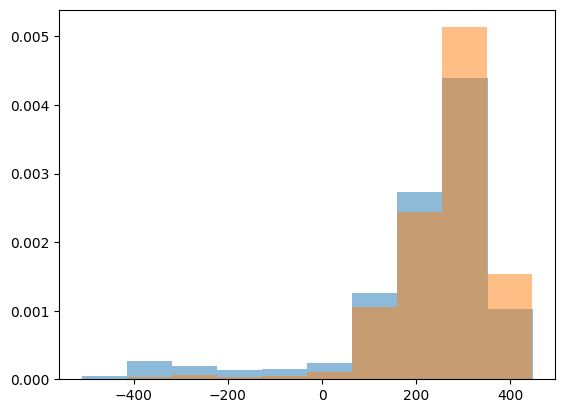

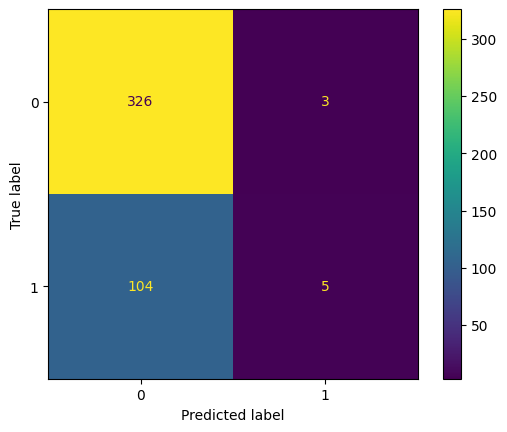

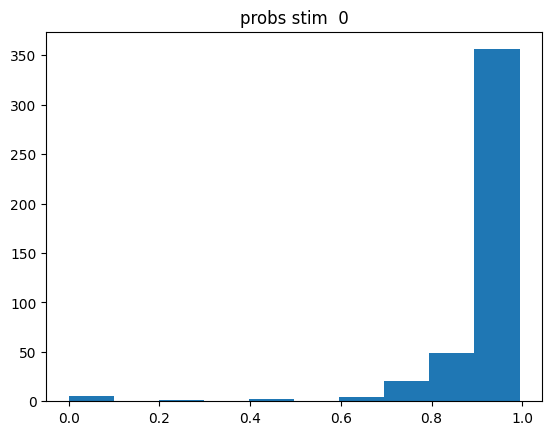

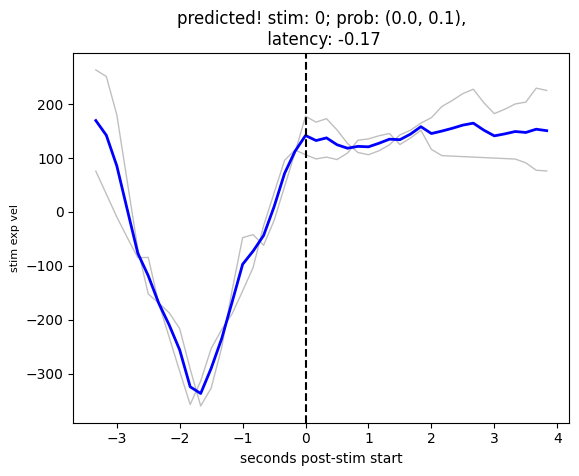

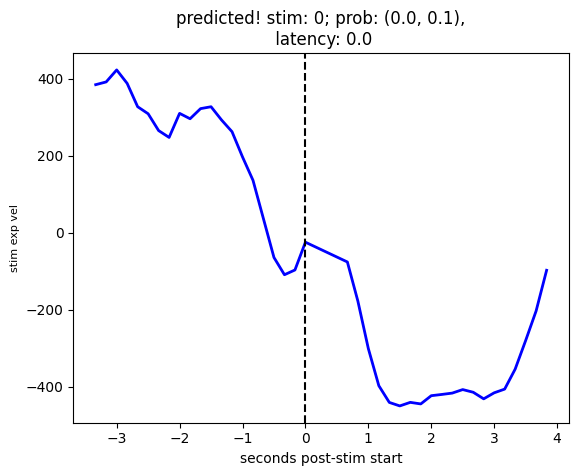

...

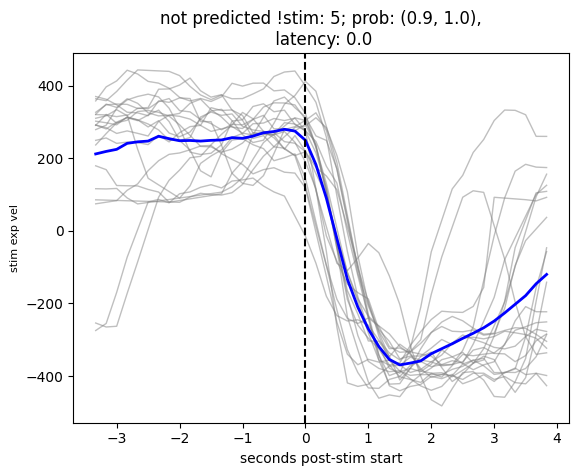

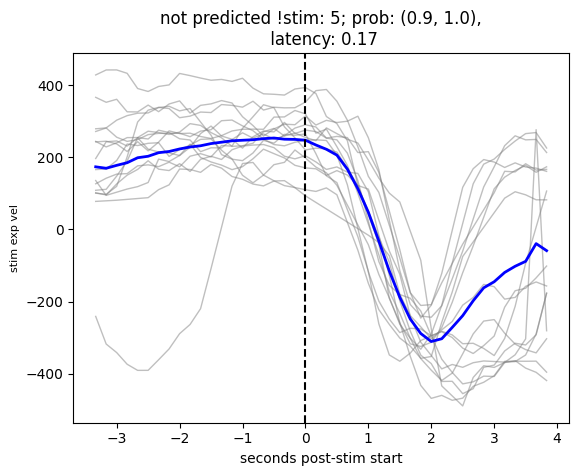

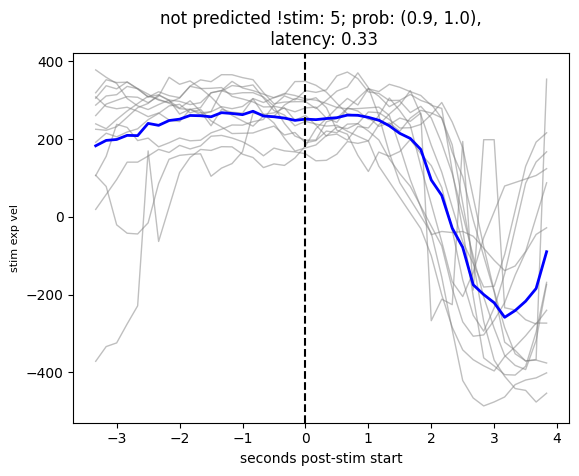

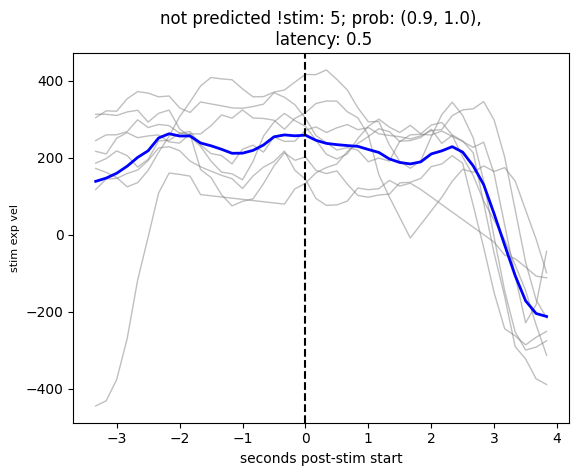

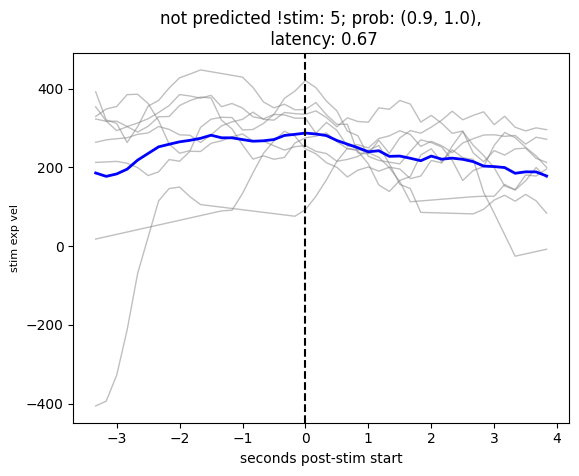

In [ ]:

from spont_rev_prediction_fncs import plot_mean_line_graph_with_individ_traces


def filter_start_ends_is_by_feature(track_start_end_is, feature_mat,  feature_min, feature_max):
    valid_is = []
    for i, (track, start, end) in enumerate(track_start_end_is):
        feature_val = feature_mat[track, start:end]
        if np.logical_and(feature_val>=feature_min, feature_val<feature_max ):
            valid_is.append(i)
    return track_start_end_is[valid_is, :]

def filter_start_ends_is_by_feature(X_vals, feature_seq,  feature_min, feature_max):  ###get X_vals from other times.. 
    valid_is = np.argwhere(np.logical_and(feature_seq>=feature_min, feature_seq<feature_max )).flatten()
    return valid_is

def get_rev_probs_from_track_start_end_is(X_vals, prob_model):
    probs = prob_model.predict_proba(X_vals)
    return probs






resampled_timesteps = [ 10, 15]#np.arange(1,20,5)

# # feature_list = stim_resampled_features# stim_matched_features #[resampled_vel, resampled_acc, resampled_curve]
# # feature_labels = ["stim resamp vel", "stim resamp accel", "stim resamp curv"]
# feature_labels = ["stim exp vel", "stim exp accel", "stim exp curv"]
# feature_list = [stim_exp_vel, stim_exp_acc, stim_exp_curve,]

data_prep_fnc = prep_data_rev_prob
model_fit_fnc = fit_eval_calibrated_linearSVC_with_prob
result_visualization_fnc = visualize_model_classification
score_fnc = balanced_accuracy_score
# data_onsets = resampled_onsets
data_onsets = exp_onsets

fps = 6




all_data = []
n_stim = len(data_onsets)
prob_model = calibrated_svc
# stim_i_to_score_means = {i:[] for i in range(n_stim)}
# stim_i_to_score_stds = {i:[] for i in range(n_stim)}


# resampled_timesteps = [1, 5, 10]#np.arange(1,20,5)

resampled_onsets = onsets
'''####get rev prob; all stim ; resampled  all beh feature s'''

title_label = f"{neuron}; Reversal prediction;\n resampled fps; all beh features; Mean ± STD balanced accuracy"

def prep_data_rev_prob_1(X_stim_all, Y_latency):
    no_rev_at_onset = Y_latency!=0
    Y_prob = np.logical_not(np.isnan(Y_latency[no_rev_at_onset]))# classfy y/n did rev happen
    X_prob = copy.deepcopy(X_stim_all[no_rev_at_onset])
    return X_prob, Y_prob, no_rev_at_onset


fps = 6
dt = 1/fps
n_pre_stim_frames = n_timesteps
n_post_stim_frames = int(fps*10)
n_post_stim_frames = int(fps*4)

latency_mins = np.arange(-1, int(5*fps))#[::15]#[-5:]
# print(latency_mins)
latency_maxs = latency_mins+1

# latency_mins = [-1]
# latency_maxs = [np.inf]
prob_mins = np.arange(0,1.11, 0.1 )[:-1]
prob_maxs =  np.arange(0,1.11, 0.1 )[1:]

# prob_mins = [-1]
# prob_maxs = [np.inf]
lstm_lag = 0

stim_i_to_Xs = {}
stim_i_to_model_Xs = {}

# for i, (data_onset, exp_onset) in [list(enumerate(zip(data_onsets, exp_onsets)))[:]]:
for i, (data_onset, exp_onset) in enumerate(zip(data_onsets, exp_onsets)):
        onset = data_onset-1
        score_means = []
        score_stds = []

        Y_latency = latency_to_reversal(stim_exp_rev, exp_onset, max_latency = 6*durations[i]+1)/6 
        X_stim_features = stim_exp_vel[:, (exp_onset-n_pre_stim_frames):(exp_onset+n_post_stim_frames)]
        n_pts = X_stim_features.shape[0]
        stim_arr = np.zeros((n_pts, n_stim))
        stim_arr[:, i]=1
        model_X = np.concatenate([X_stim_features[:, 0:n_pre_stim_frames],stim_arr], axis = 1)
        model_X, Y_prob, no_rev_at_onset = prep_data_rev_prob_1(model_X, Y_latency)
        
        X_stim_features = X_stim_features[no_rev_at_onset]
        Y_latency = Y_latency[no_rev_at_onset]
        Y_latency[np.logical_not(Y_prob)] = -0.05

        
        # probs = get_rev_probs_from_track_start_end_is(model_X , prob_model)[:,0]
        probs = prob_model.predict_proba(model_X)[:,0]
        fig, ax = plt.subplots()
        ax.hist(X_stim_features.flatten(), alpha = 0.5, label ="xtrain", density = True)
        # ax.hist(X_train.flatten(), alpha = 0.5, label ="xtrain", density = True)
        # ax.hist(X_test.flatten(), alpha = 0.5, label ="xtest", density = True)
        ax.hist(model_X[:, :n_pre_stim_frames].flatten(), alpha = 0.5, label ="xtest", density = True)
        # ax.hist(stim_exp_vel.flatten(), alpha = 0.5, label ="xtest", density = True)
        print(X_train.shape)

        print(X_test.shape)

        print(model_X.shape)

        y_pred = prob_model.predict(model_X)

        cm = confusion_matrix(Y_prob, y_pred)

        disp = ConfusionMatrixDisplay(confusion_matrix=cm)
        disp.plot()
        fig, ax = plt.subplots()
        ax.hist(probs)
        ax.set_title(f"probs stim  {i}")
        
        for probs_min, probs_max in zip(prob_mins,prob_maxs):
            for latency_min ,latency_max in zip(latency_mins, latency_maxs):
                valid_is = np.logical_and(
                                    np.logical_and(probs>=probs_min, probs<probs_max), 
                                    np.logical_and(Y_latency>=latency_min, Y_latency<latency_max)
                            )
                
                
                
                valid_is = np.logical_and(np.logical_not(y_pred),
                            np.logical_and(
                                    np.logical_and(probs>=probs_min, probs<probs_max), 
                                    np.logical_and(Y_latency>=latency_min, Y_latency<latency_max)
                            ))
                # print("valid_is.size", probs_min, probs_max , latency_min ,latency_max, np.argwhere(valid_is).flatten().size)
                if np.argwhere(valid_is).flatten().size!=0:
                    # continue
                    X_to_plot = X_stim_features[valid_is]
                    # for i, (feature, feature_lbl) in enumerate(zip(feature_list, feature_labels)):
                    feature_lbl = feature_labels[0]
                    fig, ax1 = plt.subplots()
                    # stim_aligned_feature = X_to_plot
                    # plot_mean_line_graph_with_individ_traces(stim_aligned_feature, n_pre_stim_frames, fps = fps,  fig = fig, ax =ax1 , seconds = None, 
                    #                                     #    title = f"stim: {i}; latency: {np.round(latency_min*dt,2)}; dur: {np.round(rev_duration_min*dt,2)}", 
                    #                                         title = f"stim: {i}; prob: {np.round(probs_min,2),np.round(probs_max,2) },\n latency: {np.round(latency_min*dt,2)}", # dur: {np.round(rev_duration_min*dt,2)}", 
                    #                                         xlabel ="seconds post-stim start", 
                    #                                         ylabel =f"{feature_lbl}", color = "blue", ylim =None,  ylabel_font_size = 8, 
                    #                                         max_n_tracks = 30,line_width=1.0, 
                                                            
                    #                                         )

                    # dt = 1
                    # fps = 1
                    plot_mean_line_graph_with_individ_traces(X_to_plot, n_pre_stim_frames, fps = fps,  fig = fig, ax =ax1 , seconds = None, 
                                        #    title = f"stim: {i}; latency: {np.round(latency_min*dt,2)}; dur: {np.round(rev_duration_min*dt,2)}", 
                                            title = f"not predicted !stim: {i}; prob: {np.round(probs_min,2),np.round(probs_max,2) },\n latency: {np.round(latency_min*dt,2)}", # dur: {np.round(rev_duration_min*dt,2)}", 
                                            xlabel ="seconds post-stim start", 
                                            ylabel =f"{feature_lbl}", color = "blue", ylim =None,  ylabel_font_size = 8, vline =  n_pre_stim_frames*dt, 
                                            max_n_tracks = 30,line_width=1.0, 
                                            
                                            )
                    
                    
                valid_is = np.logical_and(y_pred, 
                            np.logical_and(
                                    np.logical_and(probs>=probs_min, probs<probs_max), 
                                    np.logical_and(Y_latency>=latency_min, Y_latency<latency_max)
                            ))
                # print("valid_is.size", probs_min, probs_max , latency_min ,latency_max, np.argwhere(valid_is).flatten().size)
                if np.argwhere(valid_is).flatten().size!=0:
                    # continue
                    X_to_plot = X_stim_features[valid_is]
                    # for i, (feature, feature_lbl) in enumerate(zip(feature_list, feature_labels)):
                    feature_lbl = feature_labels[0]
                    fig, ax1 = plt.subplots()
                    # stim_aligned_feature = X_to_plot
                    # plot_mean_line_graph_with_individ_traces(stim_aligned_feature, n_pre_stim_frames, fps = fps,  fig = fig, ax =ax1 , seconds = None, 
                    #                                     #    title = f"stim: {i}; latency: {np.round(latency_min*dt,2)}; dur: {np.round(rev_duration_min*dt,2)}", 
                    #                                         title = f"stim: {i}; prob: {np.round(probs_min,2),np.round(probs_max,2) },\n latency: {np.round(latency_min*dt,2)}", # dur: {np.round(rev_duration_min*dt,2)}", 
                    #                                         xlabel ="seconds post-stim start", 
                    #                                         ylabel =f"{feature_lbl}", color = "blue", ylim =None,  ylabel_font_size = 8, 
                    #                                         max_n_tracks = 30,line_width=1.0, 
                                                            
                    #                                         )

                    # dt = 1
                    # fps = 1
                    plot_mean_line_graph_with_individ_traces(X_to_plot, n_pre_stim_frames, fps = fps,  fig = fig, ax =ax1 , seconds = None, 
                                        #    title = f"stim: {i}; latency: {np.round(latency_min*dt,2)}; dur: {np.round(rev_duration_min*dt,2)}", 
                                            title = f"predicted! stim: {i}; prob: {np.round(probs_min,2),np.round(probs_max,2) },\n latency: {np.round(latency_min*dt,2)}", # dur: {np.round(rev_duration_min*dt,2)}", 
                                            xlabel ="seconds post-stim start", 
                                            ylabel =f"{feature_lbl}", color = "blue", ylim =None,  ylabel_font_size = 8, vline =  n_pre_stim_frames*dt, 
                                            max_n_tracks = 30,line_width=1.0, 
                                            
                                            )
                    
                
                
                

                
                
        #         break
        # break
    
            
                
                # plot_mean_line_graph_with_individ_traces(stim_aligned_feature.T, n_pre_stim_frames,  fps = fps,  fig = all_fig, ax =all_axs[i] , seconds = None, 
                #                                     #    title = f"stim: {i}; latency: {np.round(latency_min*dt,2)}; dur: {np.round(rev_duration_min*dt,2)}", 
                #                                         title = f"stim: {i}; latency: {np.round(latency_min*dt,2)}", # dur: {np.round(rev_duration_min*dt,2)}", 
                #                                         xlabel ="seconds post-stim start", 
                #                                         ylabel =f"{feature_lbl}", color = "blue", ylim =None,  ylabel_font_size = 8, 
                #                                         max_n_tracks = 30,line_width=1.0
                                                            
                #                                         )



####plot kernel of coeffs (just do it for all)

#####for each stim; get rev prob; - get 30 exs of high medium low;  rev prob;  and get stim aligned features


In [113]:
stim_exp_vel.shape

(469, 1800)

In [ ]:
latency_mins

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29])

In [ ]:
prob_maxs

array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. , 1.1])

Accuracy: 0.8213836477987422
Precision: 0.8343170990896771
Recall: 0.8213836477987422
F1 Score: 0.8234845052832638
Accuracy: 0.9220125786163522
Precision: 0.9253415805194678
Recall: 0.9220125786163522
F1 Score: 0.9225155555950085
Accuracy: 0.979874213836478
Precision: 0.9804913284895416
Recall: 0.979874213836478
F1 Score: 0.9799489532899457
3
[[1.53535273e-08 9.99999985e-01]
 [2.30864087e-05 9.99976914e-01]
 [3.57824903e-09 9.99999996e-01]
 ...
 [1.74584561e-07 9.99999825e-01]
 [5.95954059e-08 9.99999940e-01]
 [1.20671675e-07 9.99999879e-01]]


(array([ 615.,   49.,   34.,   21.,   22.,   18.,   27.,   16.,   22.,
        1028.]),
 array([2.70551314e-12, 1.00000000e-01, 2.00000000e-01, 3.00000000e-01,
        4.00000000e-01, 5.00000000e-01, 6.00000000e-01, 7.00000000e-01,
        8.00000000e-01, 9.00000000e-01, 1.00000000e+00]),
 <BarContainer object of 10 artists>)

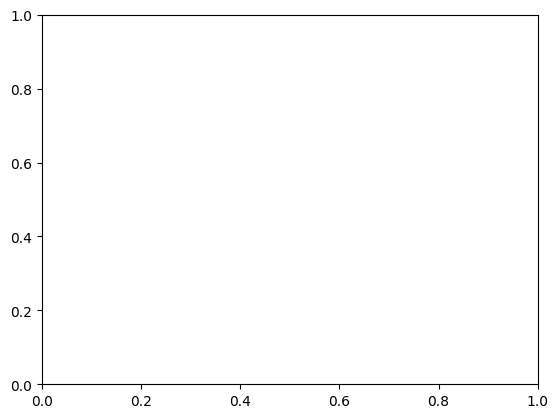

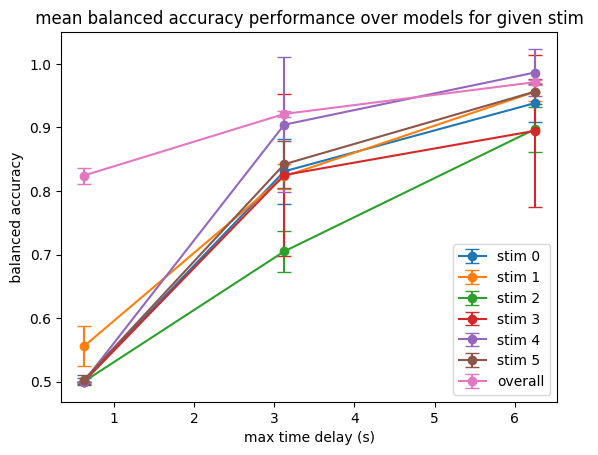

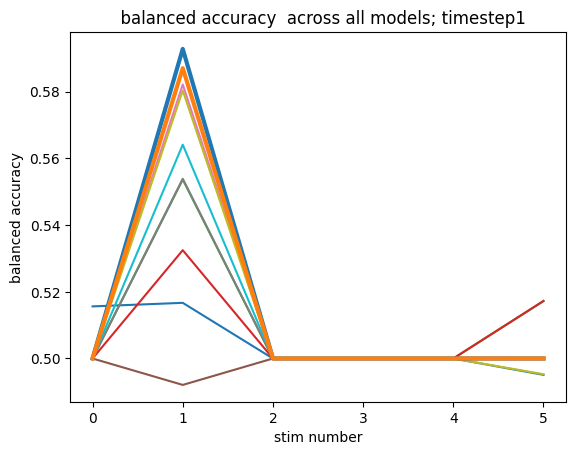

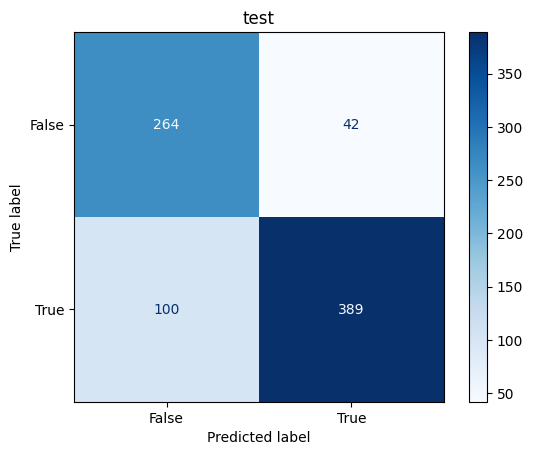

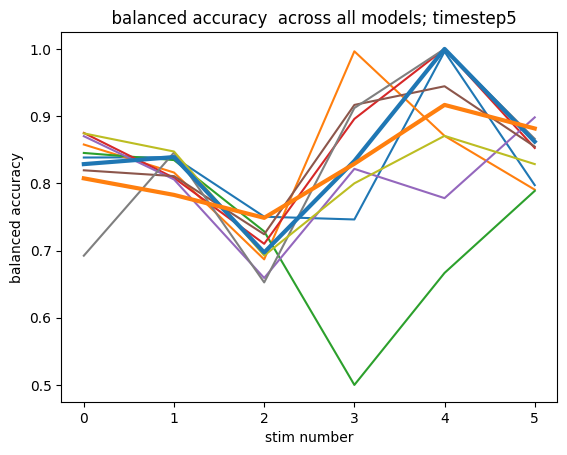

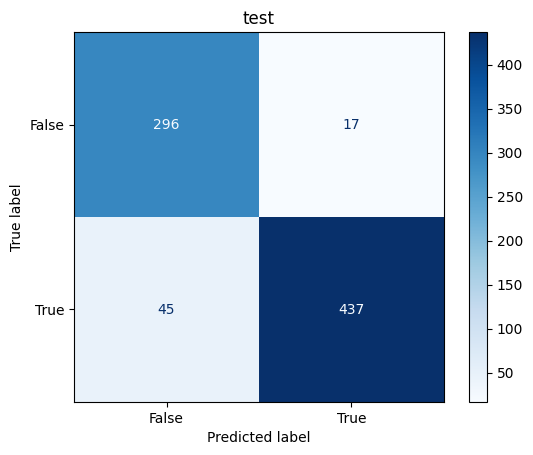

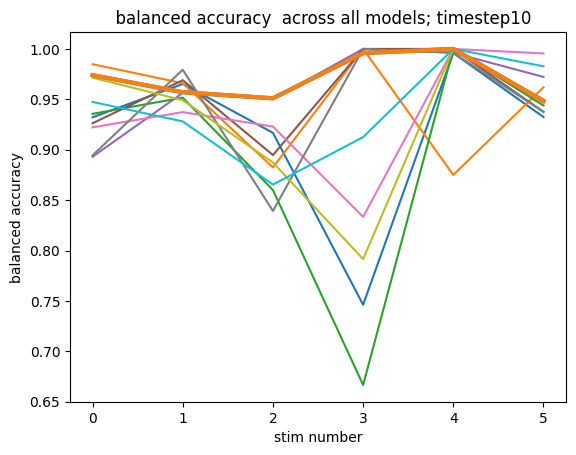

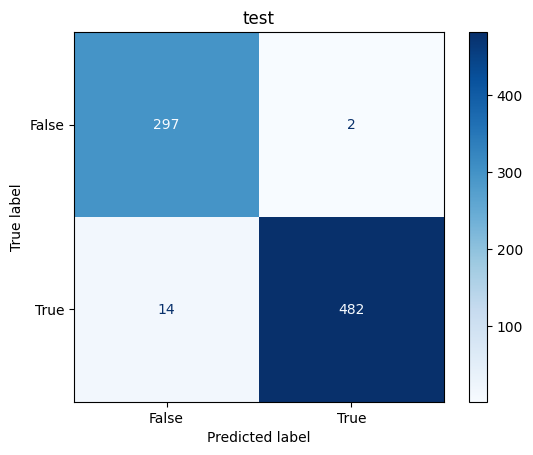

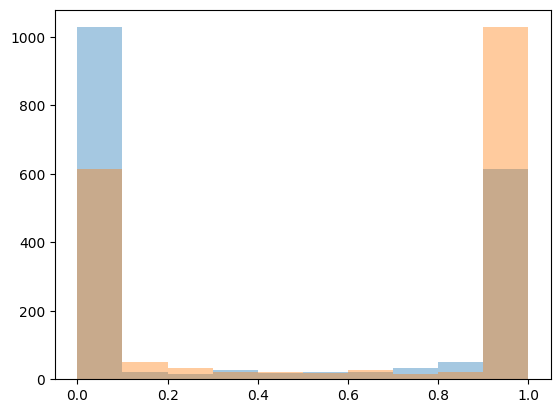

In [ ]:
# from sklearn.linear_model import LogisticRegression
# def fit_eval_logistic_regression(X_train, X_test, y_train, y_test):
    

#     best_model =  LogisticRegression(random_state=42)
#     best_model.fit(X_train, y_train)
#     y_pred = best_model.predict(X_test)
#     score = balanced_accuracy_score(y_test, y_pred)  
#     # probabilities = calibrated_svc.predict_proba(X)

#     return best_model, y_pred, score



# if experiment == "time_titration":
#     durations = [1,3,5,10]
# else:
#     durations = [5,5,5,5,5,5]
#     if experiment == "hiscl":
#         durations = [5,5]
# resampled_timesteps = [1, 5, 10]#np.arange(1,20,5)

# resampled_onsets = onsets
# '''####get rev prob; all stim ; resampled  all beh feature s'''
# feature_list = stim_matched_features #[resampled_vel, resampled_acc, resampled_curve]
# feature_labels = ["stim resamp vel", "stim resamp accel", "stim resamp curv"]
# data_prep_fnc = prep_data_rev_prob
# model_fit_fnc = fit_eval_logistic_regression
# result_visualization_fnc = visualize_model_classification
# score_fnc = balanced_accuracy_score
# data_onsets = resampled_onsets
# score_label = "balanced accuracy"
# title_label = f"{neuron}; Reversal prediction;\n resampled fps; all beh features; Mean ± STD balanced accuracy"
# fps = 1.6

# best_models_score_stim, t_to_best_model_using_min_idx_score, t_to_all_data, t_to_all_feature_names  = get_plot_multi_stim_model(
#                                                     data_prep_fnc,
#                                                     model_fit_fnc, 
#                                                     result_visualization_fnc, 
#                                                     feature_list, 
#                                                     feature_labels,
#                                                     z, 
#                                                     data_onsets,
#                                                     exp_onsets, 
#                                                     stim_exp_rev, 
#                                                     durations,
#                                                     fps,
#                                                     # title_label,
#                                                     score_fnc, 
#                                                     test_size = 0.3, 
#                                                     n_splits = 10, 
#                                                     lstm_lag = 0, 
#                                                     score_label=score_label, 
#                                                     visualize_individ_stim = False, 
#                                                     get_coeffs = False,

#                                                     all_timesteps = resampled_timesteps, 
#                                                     check_warnings = True
#                                                                         )

# n_timesteps = 10

# best_model = t_to_best_model_using_min_idx_score[n_timesteps]
# print(best_model)

# model = best_models_score_stim[n_timesteps] 
# idx = t_to_best_model_using_min_idx_score[n_timesteps]
# X_train, X_test, y_train, y_test = t_to_all_data[n_timesteps][idx]
# probs = model.predict_proba(X_train)
# print(probs)
# fig, ax = plt.subplots()
# ax.hist(probs[:, 0], alpha = 0.4)
# ax.hist(probs[:, 1], alpha = 0.4)